# Анализ рынка заведений общественного питания Москвы.

## Описание проекта <a class="tocSkip"> 

<div style="border:solid blue 2px; padding: 20px">
    
**Цель проекта** - выявить особенности рынка заведений общественного питания Москвы.
    
**Задачи проекта:**

* обработать данные в датасете;
* провести анализа данных;
* презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места;
* дать рекомендации по открытию кофейни.     
    
**План по работе с датасетом:**
    
1. Изучение общей информации о датасете
    
2. Предобработка данных    
    2.1 Типы данных     
    2.2 Дубликаты  
    2.3 Создание столбца `street`    
    2.4 Создание столбца `is_24_7`
    
3. Анализ данных    
    3.1 Категория заведений    
    3.2 Количество посадочных мест по категории заведений.    
    3.3 Соотношение сетевых и несетевых заведений.    
    3.4 Частота категорий сетевых заведений.    
    3.5 ТОП-15 популярных сетевых заведений.    
    3.6 Заведения в административных округах Москвы.    
    3.7 Распределение средних рейтингов по категориям заведений.     
    3.8 Хороплет со средним рейтингом заведений каждого района.    
    3.9 Все заведения датасета на карте.     
    3.10 Топ-15 улиц по количеству заведений.    
    3.11 Улицы с одним объектом общепита.    
    3.12 Данные о средних чеках.    
    
4. Открытие кофейни    
    4.1 Количество кофеен.     
    4.2 Часы работы кофеен.    
    4.3 Рейтинг кофеен    
    4.4 Стоимость чашки кофе. 
    
5. Общий вывод
      
</div>

## 1. Изучение общей информации и краткий анализ датасета.

Для начала импортируем все библиотеки, которые могут понадобиться в текущем исследовании:

In [1]:
!pip install folium
import pandas as pd
import folium
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import json
import plotly.express as px

from plotly import graph_objects as go
from numpy import median
from folium.plugins import MarkerCluster
from folium import Map, Marker
from folium import Choropleth

Посмотрим общую информацию о датасете:

In [2]:
moscow_places = pd.read_csv('/Users/a__places.csv')
moscow_places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [3]:
moscow_places.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
moscow_places.sample(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2811,Спорт-Бар,"бар,паб","Москва, Нижняя Первомайская улица, 68/7",Восточный административный округ,"ежедневно, 10:00–21:00",55.791033,37.818951,4.0,средние,Цена бокала пива:от 100 ₽,NaN,NaN,0,NaN
5688,Тануки,ресторан,"Москва, Можайское шоссе, 11",Западный административный округ,пн 12:00–02:00; вт-вс 11:30–02:00,55.720892,37.436163,4.3,NaN,Средний счёт:1000–1500 ₽,1250.0,NaN,1,55.0
1798,Тимир,столовая,"Москва, улица Правды, 8, корп. 13",Северный административный округ,пн-пт 09:00–19:00,55.785885,37.579431,4.5,NaN,NaN,NaN,NaN,0,0.0
4488,Шоколадница,кофейня,"Москва, улица Земляной Вал, 18-22с1",Центральный административный округ,пн-чт 08:00–22:00; пт 08:00–00:00; сб круглосу...,55.759636,37.657205,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,1,NaN
7214,Кафе,кафе,"Москва, Коломенский проезд, вл13",Южный административный округ,"ежедневно, круглосуточно",55.666259,37.642429,3.5,NaN,NaN,NaN,NaN,0,NaN


In [5]:
moscow_places.tail()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0
8405,Kebab Time,кафе,"Москва, Россошанский проезд, 6",Южный административный округ,"ежедневно, круглосуточно",55.598229,37.604702,3.9,NaN,NaN,NaN,NaN,0,12.0


Проверим уникальность ряда столбцов, чтобы выявить потенциальные ошибки в написании данных, дубликаты и т.п.:

In [6]:
moscow_places['name'].nunique()

5614

In [7]:
moscow_places['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [8]:
moscow_places['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Посмотрим количество пропущенных значений:

In [9]:
moscow_places.isna().sum().sort_values(ascending=False)

middle_coffee_cup    7871
middle_avg_bill      5257
price                5091
avg_bill             4590
seats                3611
hours                 536
name                    0
category                0
address                 0
district                0
lat                     0
lng                     0
rating                  0
chain                   0
dtype: int64

In [10]:
moscow_places.duplicated().sum()

0

<div style="border:solid blue 3px; padding: 20px">
    
**Вывод по п. 1**. На первый взгляд можно увидеть следующие вещи:

1) Наименования столбцов представлены корректно, согласно правилам оформления данных.  

2) Всего представлено 8406 значений, однако видно, что столбец `name` содержит 5614 уникальных значений, значит, есть дубляж данных или заведения одной сети.

3) Всего представлено 8 уникальных категорий заведений.

4) Всего представлено 9 административных округов. 

5) В столбце `avg_bill` , возможно, можно удалить слова типа 'Средний счет', т.к. наименование столбца уже говорит о таких данных, и это лишняя информация, также, этот столбец после удаления слов можно перевести во float, чтобы было легче анализировать данные.

6) Столбец `chain` из документации имеет всего 2 значения - 0 и 1, т.е. булев тип данных. В текущих данных мы видим другой тип - int64. Нужно перевести в корректный тип.

7) Столбец `seats` содержит тип данных float64, но логически данные с количеством мест должны быть int64. 

8) Столбец `middle_coffee_cup` содержит больше всего пропущенных значений, что может быть связано с тем, что эта информация больше связана с кофейнями, нежели чем с другими категориями заведений. 

9) Также много пропущенных значений в столбце `middle_avg_bill`, возможно, стоит их удалить, либо подумать, как лучше обработать, чтобы не было дубляжа данных. 

10) Много пропущенных значений в столбце `price` - подумать, что можно сделать с ним далее.
    
11) Явных дубликатов не обнаружено.    
</div>

# 2. Предобработка данных.

Как выяснили на предыдущем шаге, у нас есть пропуски в 6 столбцах:
* `middle_coffee_cup`    7871
* `middle_avg_bill`      5257
* `price`                5091
* `avg_bill`             4590
* `seats`                3611
* `hours`                536

На текущий момент оставлю их, так как заполнение пропусков может привести к некорректному анализу данных на текущем этапе. Анализирую далее.

### 2.1 Типы данных. <a class="tocSkip"> 

Согласно документации параметр `chain` должен иметь булев тип, однако, в таблице указан int64. Приведем его к корректному типу:

In [11]:
moscow_places['chain'] = moscow_places['chain'].astype('bool')

Сделаем проверку:

In [12]:
moscow_places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   bool   
 13  seats              4795 non-null   float64
dtypes: bool(1), float64(6), object(7)
memory usage: 862.1+ KB


Теперь тип корректен.

Данные в столбце `seats` показывают количество мест, однако, данные представлены в формате float. Логически, количество мест должно быть представлено целым числом, т.е. int. Однако, у нас есть пропущенные значения, поэтому сразу перевести в корректный тип данных не получится. На текущем этапе оставим так, как есть.

### 2.2 Дубликаты. <a class="tocSkip"> 

Приведем названия заведений к единому виду для простоты анализа, а именно приведем к строчному написанию:

In [13]:
moscow_places['name'] = moscow_places['name'].str.lower()
moscow_places['name']

0                     wowфли
1             четыре комнаты
2                      хазри
3       dormouse coffee shop
4                  иль марко
                ...         
8401              суши мания
8402               миславнес
8403                 самовар
8404            чайхана sabr
8405              kebab time
Name: name, Length: 8406, dtype: object

Ранее мы считали уникальные значения в столбце name. 5614 значений были уникальными. Посмотрим дублирующиеся наименования более подробно:

In [14]:
moscow_places['name'].duplicated().value_counts()

name
False    5512
True     2894
Name: count, dtype: int64

Видим, что у нас 2894 дублирующихся названия. В документе указано, что у нас могут быть сетевые и несетевые заведения (chain равное 0 или 1). Есть вероятность, что дублирующиеся наименования - это и есть сетевые заведения. Однако, нужно проверить, так как могут быть ошибки в данных.

Сделаем выборку заведений, имеющих одно и то же название, но при этом являющихся несетевыми:

In [15]:
moscow_places[(moscow_places['name'].duplicated()) & (moscow_places['chain'] == 0)].sort_values(by='name', ascending=False)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2898,шашлычная,кафе,"Москва, Народный проспект, 17к1с10",Восточный административный округ,"ежедневно, 10:00–22:00",55.784637,37.752144,4.2,NaN,NaN,NaN,NaN,False,NaN
5982,шашлычная,"бар,паб","Москва, Новочерёмушкинская улица, 12",Юго-Западный административный округ,"ежедневно, 11:00–23:00",55.686640,37.583504,4.3,средние,NaN,NaN,NaN,False,30.0
6516,шашлычная,кафе,"Москва, Заозёрная улица, 14",Восточный административный округ,"ежедневно, 09:00–21:00",55.716498,37.847963,4.4,NaN,NaN,NaN,NaN,False,NaN
5548,шашлычная,кафе,"Москва, Авиамоторная улица, 39",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.755822,37.716738,3.8,NaN,NaN,NaN,NaN,False,NaN
5930,шашлычная,кафе,"Москва, улица Вавилова, 5, стр. 6",Южный административный округ,"ежедневно, 10:00–22:00",55.705436,37.589052,4.3,средние,Средний счёт:300–600 ₽,450.0,NaN,False,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8230,di villaggio,кафе,"Москва, парк Тюфелева роща",Южный административный округ,"ежедневно, 12:00–21:00",55.697915,37.641741,3.3,NaN,NaN,NaN,NaN,False,NaN
6935,coffee point,кафе,"Москва, Научный проезд, 8, стр. 1",Юго-Западный административный округ,пн-пт 08:00–19:00,55.655690,37.551979,4.2,низкие,Средний счёт:50–250 ₽,150.0,NaN,False,NaN
3405,carrots and beans,кофейня,"Москва, Малая Грузинская улица, 38",Центральный административный округ,"ежедневно, 08:00–21:00",55.768116,37.572662,4.4,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,False,25.0
7365,burger club,ресторан,"Москва, улица Борисовские Пруды, 26",Южный административный округ,"ежедневно, 10:00–22:00",55.639785,37.758672,4.3,NaN,Средний счёт:250–500 ₽,375.0,NaN,False,5.0


Видно, что у нас 422 строки, где повторяется наименование 'шашлычная'. Выведем уникальные наименования из данной выборки:

In [16]:
moscow_places[(moscow_places['name'].duplicated()) & (moscow_places['chain'] == 0)]['name'].unique()

array(['кафе', 'шаурма', 'ресторан', 'столовая', 'кафе-столовая',
       'мск lounge', 'франклинс бургер', 'буфет', 'кофейня', 'бистро',
       'новая столовая', 'важная персона', 'шаурма в пите', 'ля фантази',
       'гастроферма', 'халва, сеть почтоматов', "домино'с пицца",
       'korean chick', 'one&double', 'кофе стоп', 'шашлычная',
       'pomodoro royal', 'пиццерия', 'хлеб да выпечка',
       'здоровое питание', 'гриль хаус', 'carrots and beans', 'vabene',
       'raw to go', 'istanbul kebab', 'шашлык хаус',
       'ku: рамен изакая бар', 'hellopapaya', 'nova bubble tea',
       'советские времена', 'хинкали point', 'старый город',
       'il pizzaiolo', 'блины', 'pinzeria by bontempi', 'трапезная',
       'рамен-клаб', 'хлеб насущный экспресс', 'на углях', 'папан',
       'поминальные обеды', 'ням-ням', 'кофеin', 'pasta cup & pizza',
       'домик в саду', 'wave california poke', 'кафе для поминок',
       'новатор кофе', 'one price coffee', 'han cook', 'авлабар',
       'bb gr

В представленных данных выделяется наименование 'халва, сеть почтоматов', что не является заведением общепита, удалим данную строку:

In [17]:
moscow_places.query('name == "халва, сеть почтоматов"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1067,"халва, сеть почтоматов",кафе,"Москва, улица Лётчика Бабушкина, 21/2",Северо-Восточный административный округ,NaN,55.865923,37.674490,4.1,NaN,NaN,NaN,NaN,True,NaN
2571,"халва, сеть почтоматов",кафе,"Москва, проспект Мира, 146",Северо-Восточный административный округ,пн-пт 10:00–19:00,55.820575,37.641970,3.6,NaN,NaN,NaN,NaN,False,18.0
2990,"халва, сеть почтоматов",кафе,"Москва, Семёновская площадь, 7",Восточный административный округ,пн-пт 09:00–20:00; сб 09:00–17:00,55.783530,37.720028,4.8,NaN,NaN,NaN,NaN,True,NaN
6395,"халва, сеть почтоматов",кафе,"Москва, улица Фёдора Полетаева, 15, корп. 4, с...",Юго-Восточный административный округ,NaN,55.710476,37.784227,3.7,NaN,NaN,NaN,NaN,True,NaN


Всего представлено 4 строки с данным наименованием. Удалим эти строки и сделаем проверку:

In [18]:
moscow_places = moscow_places.drop(moscow_places[moscow_places['name'] == 'халва, сеть почтоматов'].index)

In [19]:
moscow_places.query('name == "халва, сеть почтоматов"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Данные были удалены успешно.

Уникальные наименования несетевых заведений содержат как минимум одно сетевое заведение - "домино'с пицца".

Много представлено общих наименований типа 'кафе', 'шаурма', 'ресторан', 'столовая', 'кафе-столовая' и т.д. Выделим такие названия в отдельный список:

In [20]:
general_name = ['кафе', 'шаурма', 'ресторан', 'столовая', 'кафе-столовая', 'буфет', 'кофейня', 'бистро', 'шашлычная', 'пиццерия', 'блины', 'трапезная', 'поминальные обеды', 'кафе для поминок', 'чебуречная', 'кафе-кулинария', 'кафе шашлык']

In [21]:
moscow_places[moscow_places['name'].isin(general_name) & (moscow_places['chain'] == 0)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
40,кафе,кафе,"Москва, Ижорская улица, 18, стр. 1",Северный административный округ,NaN,55.895115,37.524902,3.7,NaN,NaN,NaN,NaN,False,NaN
47,кафе,кафе,"Москва, улица Маршала Федоренко, 7",Северный административный округ,"ежедневно, 11:00–00:00",55.880306,37.489760,2.8,NaN,NaN,NaN,NaN,False,35.0
50,шаурма,быстрое питание,"Москва, улица Дыбенко, 44",Северный административный округ,"ежедневно, круглосуточно",55.878339,37.483154,3.9,NaN,NaN,NaN,NaN,False,40.0
108,кафе,"бар,паб","Москва, МКАД, 82-й километр, вл18",Северо-Восточный административный округ,NaN,55.908930,37.558777,4.2,NaN,NaN,NaN,NaN,False,NaN
123,кафе,кафе,"Москва, Шенкурский проезд, 14",Северо-Восточный административный округ,NaN,55.897794,37.591395,4.3,NaN,NaN,NaN,NaN,False,50.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7931,кафе,кафе,"Москва, Каширское шоссе, 67А",Южный административный округ,NaN,55.596680,37.725980,4.0,NaN,NaN,NaN,NaN,False,NaN
7938,кафе,кафе,"Москва, улица Генерала Белова, 28, корп. 1",Южный административный округ,NaN,55.604990,37.724762,4.5,NaN,NaN,NaN,NaN,False,NaN
7945,кафе,кафе,"Москва, МКАД, 19-й километр, вл20с1",Южный административный округ,NaN,55.621773,37.781727,4.0,NaN,NaN,NaN,NaN,False,NaN
7976,кафе,кафе,"Москва, МКАД, 19-й километр, вл12с1",Южный административный округ,NaN,55.616980,37.779312,4.3,NaN,NaN,NaN,NaN,False,NaN


367 заведений с общими названиями, это довольно большой объем данных. Оставим их пока так, как есть.

Проверим дубликаты по названию и по адресу:

In [22]:
moscow_places.duplicated(subset = ['name', 'address']).sum()

3

In [23]:
moscow_places[moscow_places.duplicated(subset = ['name', 'address'], keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,False,188.0
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,True,188.0
2211,раковарня клешни и хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,False,150.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,True,150.0
3091,хлеб да выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,True,276.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,False,276.0


У нас есть 3 заведения с одинаковыми адресами и округами, удалим дубликаты:

In [24]:
moscow_places.drop_duplicates(subset=['name', 'address', 'district'], keep='first', inplace=True)

Сделаем проверку:

In [25]:
moscow_places[moscow_places.duplicated(subset = ['name', 'address', 'district'], keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


moscow_places.info()

Дубликаты были удалены.

Посмотрим данные по сетевым заведениям:

In [26]:
moscow_places[(moscow_places['name'].duplicated()) & (moscow_places['chain'] == 1)].sort_values(by='name', ascending=False)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
7781,ёрш,пиццерия,"Москва, Липецкая улица, 2, корп. 8",Южный административный округ,"ежедневно, 11:30–05:00",55.608307,37.664941,4.4,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,True,120.0
8226,ё-ланч,столовая,"Москва, Дубининская улица, 57, стр. 4",Южный административный округ,пн-пт 09:00–17:00,55.721015,37.635791,3.9,NaN,NaN,NaN,NaN,True,64.0
6690,японская кухня,ресторан,"Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,NaN,55.657255,37.481547,4.4,NaN,NaN,NaN,NaN,True,1288.0
7031,японская кухня,кафе,"Москва, Балаклавский проспект, 14А",Южный административный округ,NaN,55.641926,37.606743,4.4,NaN,NaN,NaN,NaN,True,150.0
7497,японская кухня,ресторан,"Москва, Мячковский бульвар, 3А",Юго-Восточный административный округ,"ежедневно, 10:00–02:00",55.658020,37.751564,4.3,NaN,NaN,NaN,NaN,True,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4632,7 сэндвичей,кофейня,"Москва, 4-й Сыромятнический переулок, 3/5с3",Центральный административный округ,"ежедневно, 09:00–19:00",55.754957,37.667534,4.2,средние,Средний счёт:160–500 ₽,330.0,NaN,True,NaN
3282,18 грамм,кофейня,"Москва, Шелепихинская набережная, 34, корп. 2",Северо-Западный административный округ,"пн-пт 08:00–22:00; сб,вс 09:00–22:00",55.762761,37.509574,4.6,NaN,NaN,NaN,NaN,True,NaN
4723,18 грамм,кофейня,"Москва, набережная Академика Туполева, 15Б",Центральный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–21:00",55.760838,37.681958,4.4,средние,Цена чашки капучино:100–200 ₽,NaN,150.0,True,NaN
5069,10 идеальных пицц,ресторан,"Москва, улица Большие Каменщики, 9сЕ",Центральный административный округ,"ежедневно, 11:45–22:30",55.738074,37.656047,4.3,NaN,NaN,NaN,NaN,True,NaN


Всего в выборке представлено 2468 сетевых заведений. Посмотрим, какие названия заведений встречаются чаще всего:

In [27]:
name_places = moscow_places.groupby('name').agg(count=('name', 'count')).sort_values(by='count', ascending=False).reset_index()
name_places = name_places.rename(columns = {'name': 'Название заведения', 'count': 'Количество'})
name_places.head(10)

,Название заведения,Количество
0,кафе,189
1,шоколадница,120
2,домино'с пицца,77
3,додо пицца,74
4,one price coffee,72
5,яндекс лавка,69
6,cofix,65
7,prime,50
8,хинкальная,44
9,шаурма,43


Если опустим 'кафе', то самая крупная сеть - 'Шоколадница', насчитывающая 120 заведений.

После обработки дубликатов и "выбросов", посмотрим, сколько значений у нас осталось:

In [28]:
len(moscow_places)

8399

<div style="border:solid pink 2px; padding: 20px">
    
**Вывод по п. 2.1 и п. 2.2**.
    
1) Столбец `chain` был приведен к булевому типу;
    
2) Было удалено 7 дубликатов - с 8406 до 8399 значений;
    
3) Было выявлено, что в подборке есть неуникальные названия, например, 422 значений с наименованием 'шашлычная', которые составляют большую часть выборки, поэтому их было принято решение оставить. 

4) Самая крупная сеть заведений - 'Шоколадница', насчитывающая 120 заведений.     

</div>

### 2.3 Создание столбца `street`. <a class="tocSkip"> 

Создадим новый столбец, выделив информацию с названием улицы из существующего столбца address и сделаем проверку:

In [29]:
moscow_places['street'] = moscow_places['address'].str.split(', ').str[1]
moscow_places['street']

0                 улица Дыбенко
1                 улица Дыбенко
2            Клязьминская улица
3       улица Маршала Федоренко
4           Правобережная улица
                 ...           
8401          Профсоюзная улица
8402      Пролетарский проспект
8403           Люблинская улица
8404           Люблинская улица
8405        Россошанский проезд
Name: street, Length: 8399, dtype: object

### 2.4 Создание столбца `is_24_7` . <a class="tocSkip"> 

Создадим столбец `is_24_7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7).

* True - заведение работает ежедневно и круглосуточно; 
* False - в противоположном случае.

In [30]:
moscow_places['is_24/7'] = moscow_places[moscow_places['hours'].apply(lambda x: 'ежедневно, круглосуточно' in str(x))]['hours'] == 'ежедневно, круглосуточно'
moscow_places['is_24/7'] = moscow_places['is_24/7'].fillna(False)

Сделаем проверку:

In [31]:
moscow_places.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8399 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8399 non-null   object 
 1   category           8399 non-null   object 
 2   address            8399 non-null   object 
 3   district           8399 non-null   object 
 4   hours              7866 non-null   object 
 5   lat                8399 non-null   float64
 6   lng                8399 non-null   float64
 7   rating             8399 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8399 non-null   bool   
 13  seats              4791 non-null   float64
 14  street             8399 non-null   object 
 15  is_24/7            8399 non-null   bool   
dtypes: bool(2), float64(6), objec

<div style="border:solid blue 3px; padding: 20px">
    
**Вывод по п. 2**. 
    
1) Для дальнейшего анализа были добавлены 2 столбца - `street` и `is_24_7`.
    
2) Так как в данных есть много пропущенных значений, было нецелеобразно заменять их средними или медианными значениями или какими-либо другими, так как это может повлиять на результаты исследования.
    
3) Было удалено 7 неявных дубликатов.
    
4) В данных много неуникальных наименований - кафе, шашлычная, шаурма, столовая и т.д., их также оставляем для дальнейшего исследования.
    
5) "Шоколадница" является самым крупным сетевым заведением, насчитывающим 120 точек.    
</div>

## 3. Анализ данных.

### 3.1 Категории заведений.  <a class="tocSkip"> 

Ранее мы уже выделяли типы заведений через наличие уникальных категорий:

In [32]:
moscow_places['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

Посчитаем количество заведений в каждой категории через сводную таблицу:

In [33]:
count_category = moscow_places.groupby('category')['name'].agg('count').sort_values( ascending= False).reset_index()
count_category = count_category.rename(columns = {'category': 'Категория','name': 'Количество'})
count_category.set_index('Категория')

,Количество
Категория,
кафе,2373
ресторан,2042
кофейня,1413
"бар,паб",764
пиццерия,633
быстрое питание,603
столовая,315
булочная,256


Добавим долю заведений от общего количества для анализа:

In [34]:
count_category['Доля от всего количества'] = (count_category['Количество']/(count_category['Количество'].sum())*100).round(0)
count_category.set_index('Категория')

,Количество,Доля от всего количества
Категория,,
кафе,2373,28.0
ресторан,2042,24.0
кофейня,1413,17.0
"бар,паб",764,9.0
пиццерия,633,8.0
быстрое питание,603,7.0
столовая,315,4.0
булочная,256,3.0


Построим график:

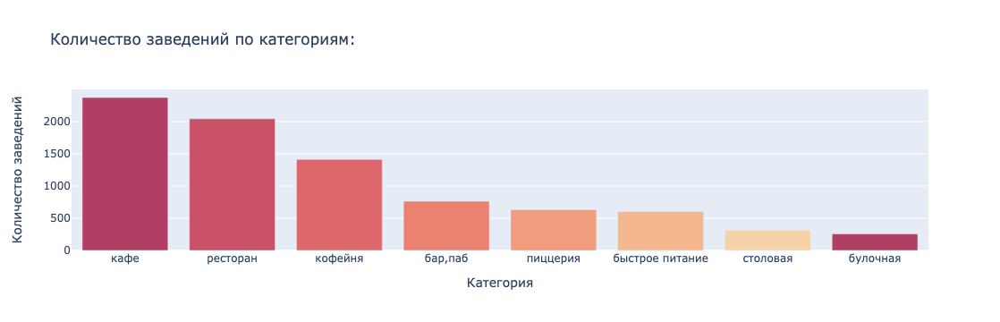

In [35]:
fig = px.bar(count_category, 
             x = 'Категория', 
             y = 'Количество',
             color = 'Категория',
             title = 'Количество заведений по категориям:', 
             color_discrete_sequence = px.colors.sequential.Redor_r)
fig.update_layout(yaxis_title='Количество заведений',
                  xaxis_title='Категория',
                  showlegend=False)
fig.show()

<div style="border:solid pink 2px; padding: 20px">
    
**Вывод по п. 3.1**.
    
1) ТОП-3 объектов общественного питания составляют **кафе**, **рестораны** и **кофейни** и занимают порядка **69%** от всех заведений. 
    
2) Больше всего в выборке заведений Москвы оказалось **кафе** - 2373 или 28.3% от всего количества.
    
3) Меньше всего заведений категорий **'столовая'** и **'булочная'** - всего 315 или 3.05% и 256 или 3.05% соответственно.
    
4) Кафе и рестораны покрывают бОльшую аудиторию, так как могут предоставить разнообразное меню, содержащее и продукты быстрого питания, и пиццы и булочные изделия, а также покрыть барной картой как кофейные, так и алкогольные напитки.

</div>

### 3.2 Количество посадочных мест по категории заведений.  <a class="tocSkip"> 

Посмотрим столбец `seats` более подробно:

In [36]:
moscow_places['seats'].describe()

count    4791.000000
mean      108.380296
std       122.847013
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

Самое большое число мест - 1288, это могут быть единичные случаи, расчитанные на организацию больших банкетов.
Минимальное число мест - 0, где могут быть кофе поинты или булочные без возможности находиться в помещении. 
Так как разброс у нас довольно большой - от 0 до 1288, то посчитаем медианные значения для каждой категории через сводную таблицу:

In [37]:
category_seats = moscow_places.groupby('category')['seats'].agg('median').sort_values( ascending= False).reset_index()
category_seats = category_seats.rename(columns = {'category': 'Категория','seats': 'Медианное количество мест'})
category_seats.set_index('Категория')

,Медианное количество мест
Категория,
ресторан,86.0
"бар,паб",82.0
кофейня,80.0
столовая,75.5
быстрое питание,65.0
кафе,60.0
пиццерия,55.0
булочная,50.0


In [38]:
category_name = category_seats['Категория']
values = category_seats['Медианное количество мест']

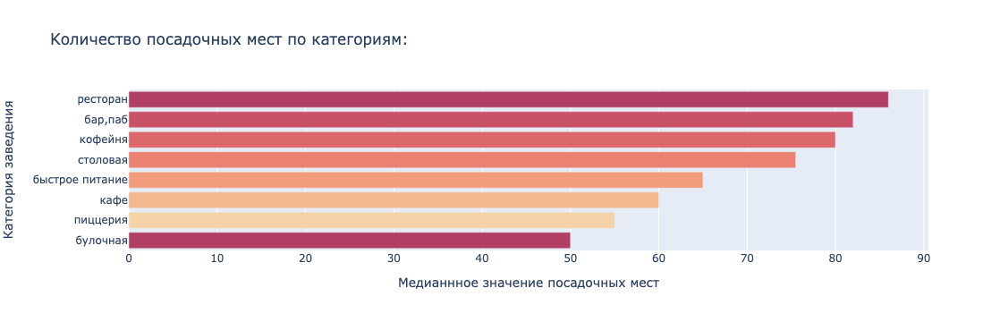

In [39]:
fig = px.bar(category_seats, 
             x = 'Медианное количество мест', 
             y = 'Категория',
             color = 'Категория',
             title = 'Kоличество посадочных мест по категориям:', 
             color_discrete_sequence = px.colors.sequential.Redor[::-1])
fig.update_layout(yaxis_title='Категория заведения',
                  xaxis_title='Медианнное значение посадочных мест',
                  showlegend=False)
fig.show()

<div style="border:solid pink 2px; padding: 20px">

**Вывод по п. 3.2**.
    
1) ТОП-3 объектов общественного питания по медианному количеству посадочных мест составляют **рестораны**, **бары** и **кофейни**. 
    Это может объясняться тем, что в ресторанах и барах часто есть большие свободные пространства - например, для живой музыки  или проведения небольшого концерта.
    Также в ресторанах обычно проводят крупные мероприятия - свадьбы, корпоративы, праздники, поэтому количество мест здесь больше, чем в других категориях заведений.

2) Самое маленькое количество мест у категорий **'пиццерия'** и **'булочная'**. Традиционно, эти категории заведений не предполагают, что люди будут проводить время внутри помещения - пиццу приятнее есть в компании друзей дома, а булочки - в кругу семьи.

3) Все данные выглядят реальными и логичными.


</div>

### 3.3 Соотношение сетевых и несетевых заведений.  <a class="tocSkip"> 

Найдем количество сетевых и несетевых заведений через создание нового датафрейма:

In [40]:
chain_count = pd.DataFrame({'Тип заведения': moscow_places['chain'].value_counts().index, 
                           'Количество': moscow_places['chain'].value_counts().values})
chain_count['Тип заведения'] = chain_count['Тип заведения'].replace({0: 'Несетевые', 1: 'Сетевые'})
chain_count

,Тип заведения,Количество
0,False,5199
1,True,3200


In [41]:
chain_count.set_index('Тип заведения')

,Количество
Тип заведения,
False,5199
True,3200


Из данных видим, что несетевые заведения составляют бОльшую часть выборки.

Представим данные визуально:

In [42]:
chain_name = chain_count['Тип заведения']
chain_с = chain_count['Количество']

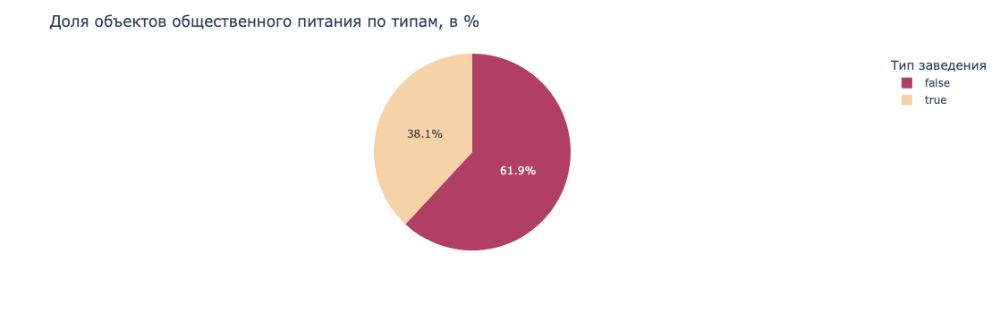

In [43]:
fig = px.pie(chain_count, values = chain_с, names = chain_name,
             color_discrete_sequence = px.colors.sequential.Redor[::-6])
fig.update_layout(title='Доля объектов общественного питания по типам, в %',
                 showlegend=True, legend_title='Тип заведения')
fig.show()

<div style="border:solid pink 2px; padding: 20px">

**Вывод по п. 3.3**.
    
**Несетевые заведения** представляют наибольшее число объектов общественного питания - практически **62%** от всего количества, когда как **сетевые** занимают всего **38%**.

</div>

### 3.4 Частота категорий сетевых заведений.  <a class="tocSkip"> 

Разделим категории заведений на типы - сетевые и несетевые, и переведем тип данных столбца 'Тип' в object, чтобы построить в дальнейшем визуализацию с несколькими столбцами:  

In [44]:
chain_types = moscow_places.groupby(['category', 'chain'])['name'].agg('count').reset_index()
chain_types = chain_types.rename(columns = {'category': 'Категория', 'chain': 'Тип', 'name': 'Количество'})
chain_types

,Категория,Тип,Количество
0,"бар,паб",False,596
1,"бар,паб",True,168
2,булочная,False,99
3,булочная,True,157
4,быстрое питание,False,371
5,быстрое питание,True,232
6,кафе,False,1597
7,кафе,True,776
8,кофейня,False,693
9,кофейня,True,720


Выделим категорию сетевых заведений:

In [45]:
chain_types_update = chain_types[chain_types['Тип']==True].sort_values('Количество', ascending= False).reset_index()
chain_types_update.drop(['index', 'Тип'], axis= 1 , inplace= True )
chain_types_update = chain_types_update.rename(columns = {'category': 'Категория', 'Количество': 'Количество сетевых заведений'})
chain_types_update

,Категория,Количество сетевых заведений
0,кафе,776
1,ресторан,729
2,кофейня,720
3,пиццерия,330
4,быстрое питание,232
5,"бар,паб",168
6,булочная,157
7,столовая,88


Для построения визуализации и сравнения добавлю новый столбец 'Всего заведений' через создание pd.Series, где будут данные из датафрейма count_category:

In [46]:
chain_types_update['Всего заведений']= [2373,
                              2042,
                              1413,
                              633,
                              603,
                              764,
                              256,
                              315]
chain_types_update

,Категория,Количество сетевых заведений,Всего заведений
0,кафе,776,2373
1,ресторан,729,2042
2,кофейня,720,1413
3,пиццерия,330,633
4,быстрое питание,232,603
5,"бар,паб",168,764
6,булочная,157,256
7,столовая,88,315


Добавим еще один столбец - Доля сетевых заведений:

In [47]:
chain_types_update['Доля сетевых заведений'] = (chain_types_update['Количество сетевых заведений']/(chain_types_update['Всего заведений'])*100).round(1)
chain_types_update.set_index('Категория')

,Количество сетевых заведений,Всего заведений,Доля сетевых заведений
Категория,,,
кафе,776,2373,32.7
ресторан,729,2042,35.7
кофейня,720,1413,51.0
пиццерия,330,633,52.1
быстрое питание,232,603,38.5
"бар,паб",168,764,22.0
булочная,157,256,61.3
столовая,88,315,27.9


Из таблицы видим, что большая часть сетевых в разрезе доли определенной категории представлена в булочных - 61%, пиццериях - 52% и кофейнях - 51%. Однако в разрезе количества, больше всего сетевых кафе, ресторанов и кофеен. 

Строим визуализацию:

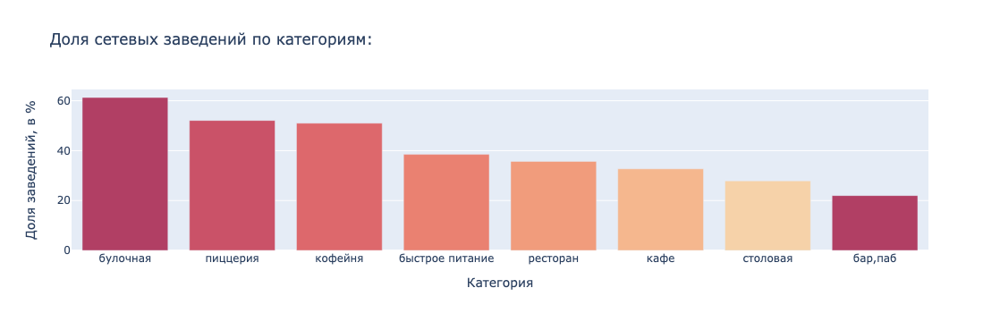

In [48]:
data = chain_types_update.sort_values('Доля сетевых заведений', ascending = False)
fig = px.bar(data, 
             x = 'Категория', 
             y = 'Доля сетевых заведений',
             color = 'Категория',
             title = 'Доля сетевых заведений по категориям:', 
             color_discrete_sequence = px.colors.sequential.Redor_r)
fig.update_layout(yaxis_title='Доля заведений, в %',
                  xaxis_title='Категория',
                  showlegend=False)
fig.show()

<div style="border:solid pink 2px; padding: 20px">

**Вывод по п. 3.4**.
    
1) По абсолютным величинам больше всего заведений представлено в категориях **кафе** (776), **ресторан** (729) и **кофейня** (720). Однако в разрезе относительных величин больше всего доля сетевых заведений у категорий **булочная** (61%), **пиццерия** (52%) и **кофейня** (51%). 
    
2) Стоит отметить, что количество сетевых заведений меньше, чем несетевых. Это может быть связано с несколькими причинами:
* Стоимость открытия бизнеса может быть дешевле, чем покупка франшизы сети.
* Возможность выделяться на рынке. Купив франшизу, следует придерживаться ее правил. Имея собственное несетевое заведение есть свобода оформлять дизайн, планировать меню и барную карту самостоятельно. 
</div>

### 3.5 ТОП-15 популярных сетевых заведений.  <a class="tocSkip"> 

Сделаем выборку только сетевых заведений:

In [49]:
chain_places = moscow_places[moscow_places['chain']==True]
chain_places

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,True,148.0,Правобережная улица,False
13,буханка,булочная,"Москва, Базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,True,180.0,Базовская улица,False
19,пекарня,булочная,"Москва, Ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.887969,37.515688,4.4,NaN,NaN,NaN,NaN,True,NaN,Ижорский проезд,True
20,чебуреки манты,кафе,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.880287,37.448646,4.3,NaN,NaN,NaN,NaN,True,148.0,Правобережная улица,False
23,буханка,булочная,"Москва, Лобненская улица, 13к2",Северный административный округ,"ежедневно, 08:00–22:00",55.888421,37.527106,4.7,NaN,NaN,NaN,NaN,True,NaN,Лобненская улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8317,беседка,кафе,"Москва, Кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,True,NaN,Кузьминская улица,False
8340,семейный очаг,ресторан,"Москва, Шоссейная улица, 13",Юго-Восточный административный округ,"ежедневно, 12:00–00:00",55.688104,37.725197,4.3,средние,Средний счёт:до 1000 ₽,1000.0,NaN,True,98.0,Шоссейная улица,False
8372,чайхана sabr,ресторан,"Москва, улица Хлобыстова, 22",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.716361,37.813436,3.9,средние,Средний счёт:150–350 ₽,250.0,NaN,True,32.0,улица Хлобыстова,False
8379,лагман хаус,кафе,"Москва, Новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,True,40.0,Новороссийская улица,False


Выберем ТОП-15 сетевых заведений по их количеству:

In [50]:
top_15 = chain_places.groupby('name')\
    .agg({'category' : pd.Series.mode, 'district' : 'count'})
top_15 = top_15.sort_values('district', ascending = False).reset_index().head(15)
top_15 = top_15.rename(columns = {'name': 'Название сети', 'category': 'Категория', 'district': 'Количество заведений'})
top_15.set_index('Название сети')

,Категория,Количество заведений
Название сети,,
шоколадница,кофейня,120
домино'с пицца,пиццерия,76
додо пицца,пиццерия,74
one price coffee,кофейня,71
яндекс лавка,ресторан,69
cofix,кофейня,65
prime,ресторан,50
хинкальная,кафе,44
кофепорт,кофейня,42


Отфильтруем заведения только из рейтинга ТОП-15 и посмотрим, какое количество категорий и их долей принадлежит популярным сетевым заведениям:

In [51]:
chain_category_diff = chain_places[chain_places['name'].isin(top_15['Название сети'])]
chain_category_diff

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
13,буханка,булочная,"Москва, Базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,True,180.0,Базовская улица,False
23,буханка,булочная,"Москва, Лобненская улица, 13к2",Северный административный округ,"ежедневно, 08:00–22:00",55.888421,37.527106,4.7,NaN,NaN,NaN,NaN,True,NaN,Лобненская улица,False
32,додо пицца,пиццерия,"Москва, Коровинское шоссе, 23, корп. 1",Северный административный округ,"ежедневно, 09:00–23:00",55.877388,37.523334,4.3,NaN,Средний счёт:328 ₽,328.0,NaN,True,46.0,Коровинское шоссе,False
34,домино'с пицца,пиццерия,"Москва, Клязьминская улица, 11, корп. 4",Северный административный округ,"ежедневно, 10:00–23:00",55.886963,37.523518,4.2,NaN,Средний счёт:от 500 ₽,500.0,NaN,True,247.0,Клязьминская улица,False
46,cofefest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,True,NaN,улица Маршала Федоренко,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7973,теремок,ресторан,"Москва, Ореховый бульвар, 15",Южный административный округ,"ежедневно, 10:00–22:00",55.612758,37.720272,3.7,NaN,NaN,NaN,NaN,True,0.0,Ореховый бульвар,False
7974,хинкальная,ресторан,"Москва, улица Генерала Белова, 23А",Южный административный округ,"ежедневно, 12:00–00:00",55.616224,37.719993,3.6,NaN,NaN,NaN,NaN,True,60.0,улица Генерала Белова,False
7979,яндекс лавка,ресторан,"Москва, Шипиловский проезд, 65, корп. 1",Южный административный округ,"ежедневно, 07:00–00:00",55.599020,37.714239,3.5,NaN,NaN,NaN,NaN,True,75.0,Шипиловский проезд,False
7980,яндекс лавка,ресторан,"Москва, улица Маршала Захарова, 2",Южный административный округ,"ежедневно, 07:00–00:00",55.624112,37.707183,4.0,NaN,NaN,NaN,NaN,True,200.0,улица Маршала Захарова,False


Всего у нас представлено 816 сетевых заведений, которые входят в рейтинг ТОП-15 сетевых заведений. Посмотрим их в разрезе категорий:

In [52]:
data_1 = chain_category_diff.groupby('category')['name'].agg('count').reset_index()
data_1 = data_1.sort_values('name', ascending = False)
data_1 = data_1.rename(columns = {'category': 'Категория', 'name': 'Количество'})
data_1.set_index('Категория')

data_1['Доля заведений'] = (data_1['Количество']/data_1['Количество'].sum()*100).round(0)
data_1.set_index('Категория')

,Количество,Доля заведений
Категория,,
кофейня,336,41.0
ресторан,186,23.0
пиццерия,151,19.0
кафе,100,12.0
булочная,25,3.0
быстрое питание,12,1.0
"бар,паб",4,0.0
столовая,2,0.0


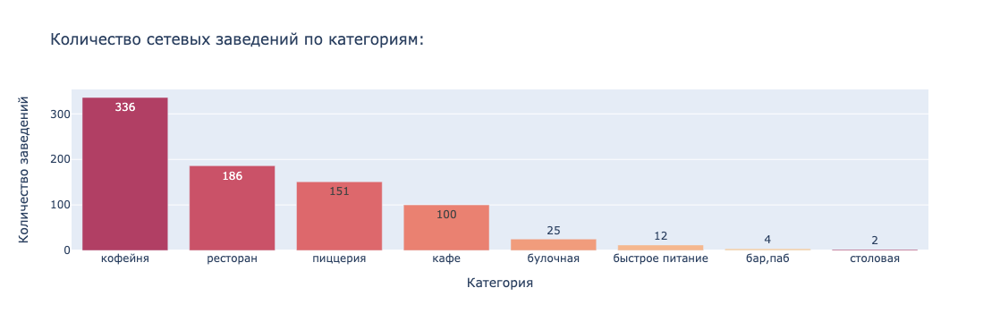

In [53]:
fig = px.bar(data_1, 
             x = 'Категория', 
             y = 'Количество',
             color = 'Категория',
             title = 'Количество сетевых заведений по категориям:', 
             color_discrete_sequence = px.colors.sequential.Redor_r,
            text = 'Количество')
fig.update_layout(yaxis_title='Количество заведений',
                  xaxis_title='Категория',
                  showlegend=False)
fig.show()

Из графика видим, что среди ТОП-15 сетевых заведений преобладают кофейни - 336 заведений, также в тройку лидеров входят рестораны (186) и пиццерии (151).

Добавим столбец с долей заведений:

In [54]:
top_15['Доля заведений'] = (top_15['Количество заведений']/(top_15['Количество заведений'].sum())*100).round(1)
top_15.set_index('Название сети')

,Категория,Количество заведений,Доля заведений
Название сети,,,
шоколадница,кофейня,120,14.7
домино'с пицца,пиццерия,76,9.3
додо пицца,пиццерия,74,9.1
one price coffee,кофейня,71,8.7
яндекс лавка,ресторан,69,8.5
cofix,кофейня,65,8.0
prime,ресторан,50,6.1
хинкальная,кафе,44,5.4
кофепорт,кофейня,42,5.1


Построим график с ТОП-15 популярных сетей в Москве:

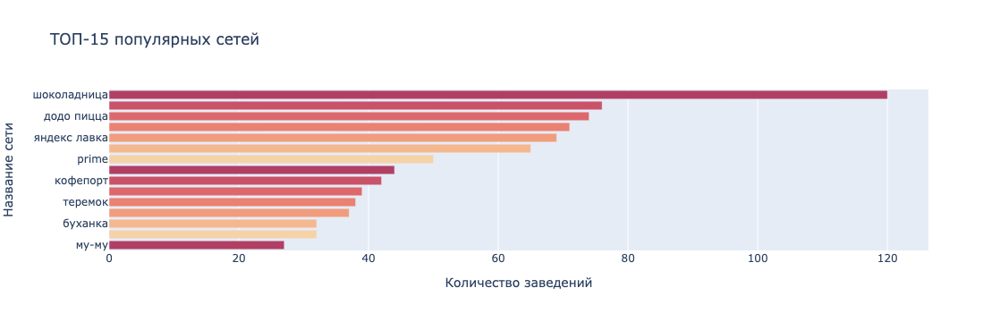

In [55]:
fig = px.bar(top_15, 
             x = 'Количество заведений', 
             y = 'Название сети',
             color = 'Название сети',
             title = 'ТОП-15 популярных сетей', 
             color_discrete_sequence = px.colors.sequential.Redor[::-1])
fig.update_layout(yaxis_title='Название сети',
                  xaxis_title='Количество заведений',
                  showlegend=False)
fig.show()

<div style="border:solid pink 2px; padding: 20px">

**Вывод по п. 3.5**.
    
1) Самой популярной сетью в Москве является **'Шоколадница'** - **120 заведений** или **15%** от всего количества сетевых заведений. 

2) Далее идут практически с минимальным отрывом друг от друга сеть пиццерий **Домино'c пицца (9.3%)** и **Додо пицца (9.1%)**. 

3) На последнем месте рейтинга находится сеть кафе **'Му-му' (3.3%)**.

4) Из всего рейтинга мне знакомы несколько названий:
* Шоколадница
* Домино'c пицца 
* Додо пицца
* Яндекс лавка
* Cofix
* Теремок

5) Эти сети объединяет то, что заведения покрывают практически многие регионы России (кроме Теремка). Если говорить в целом про рейтинг, то можно увидеть, что большая часть заведений - кофейни: 'Шоколадница', 'One price coffee', 'Cofix', 'Кофепорт', 'Cofefest'. Остальные заведения входят в категории пиццерий, кафе и др.
    
6) Среди сетевых заведений из рейтинга ТОП-15 самой крупной категорией являются **кофейни** - занимают 41% (или 336 заведений)от всех категорий рейтинга, также в тройку вошли **рестораны** (23% или 186) и **пиццерии** (19% или 151). Меньше всего сетевых заведений в категории 'бар' и 'столовая' (4% и 2%, соответственно).    
    
</div>

### 3.6 Заведения в административных округах Москвы.  <a class="tocSkip"> 

Ранее мы уже выявили, что в данных представлено 9 округов:

In [56]:
moscow_places['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Посчитаем количество заведений общественного питания по округам:

In [57]:
eat_district = moscow_places.groupby('district')['name'].agg('count').reset_index()
eat_district = eat_district.sort_values('name', ascending = False)
eat_district = eat_district.rename(columns = {'district': 'Округ', 'name': 'Количество заведений'})
eat_district.set_index('Округ')

,Количество заведений
Округ,
Центральный административный округ,2242
Северный административный округ,899
Южный административный округ,892
Северо-Восточный административный округ,888
Западный административный округ,850
Восточный административный округ,797
Юго-Восточный административный округ,713
Юго-Западный административный округ,709
Северо-Западный административный округ,409


Добавим долю:

In [58]:
eat_district['Доля заведений от общего количества'] = (eat_district['Количество заведений']/(eat_district['Количество заведений'].sum())*100).round(0)
eat_district.set_index('Округ')

,Количество заведений,Доля заведений от общего количества
Округ,,
Центральный административный округ,2242,27.0
Северный административный округ,899,11.0
Южный административный округ,892,11.0
Северо-Восточный административный округ,888,11.0
Западный административный округ,850,10.0
Восточный административный округ,797,9.0
Юго-Восточный административный округ,713,8.0
Юго-Западный административный округ,709,8.0
Северо-Западный административный округ,409,5.0


In [59]:
chain_name_1 = eat_district['Округ']
chain_с_1 = eat_district['Количество заведений']

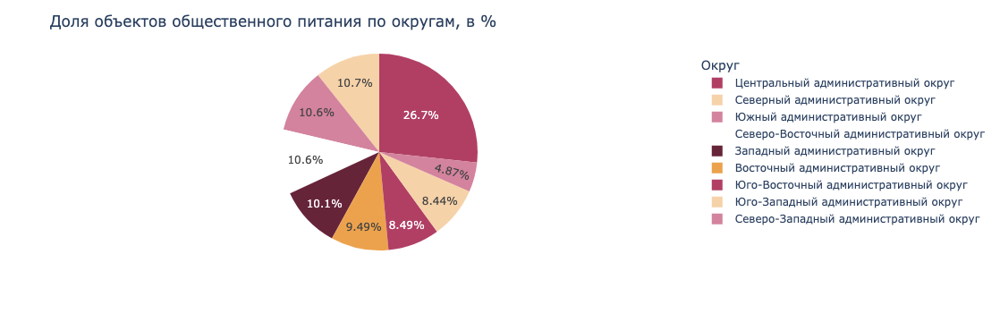

In [60]:
fig = px.pie(eat_district, values = chain_с_1, names = chain_name_1,
             color_discrete_sequence = px.colors.sequential.Redor[::-6])
fig.update_layout(title='Доля объектов общественного питания по округам, в %',
                 showlegend=True, legend_title='Округ')
fig.show()

Выведем данные с информацией об округах и количестве категорий заведений в каждом округе:

In [61]:
count_place_district = moscow_places.groupby(['district', 'category'])['name'].count().reset_index()
count_place_district
count_place_district.columns = ['Округ', 'Категория', 'Количество заведений']
count_place_district = count_place_district.sort_values('Количество заведений', ascending=False)
count_place_district.set_index('Округ')

,Категория,Количество заведений
Округ,,
Центральный административный округ,ресторан,670
Центральный административный округ,кафе,464
Центральный административный округ,кофейня,428
Центральный административный округ,"бар,паб",364
Юго-Восточный административный округ,кафе,281
...,...,...
Северо-Западный административный округ,"бар,паб",23
Северо-Западный административный округ,столовая,18
Юго-Западный административный округ,столовая,17


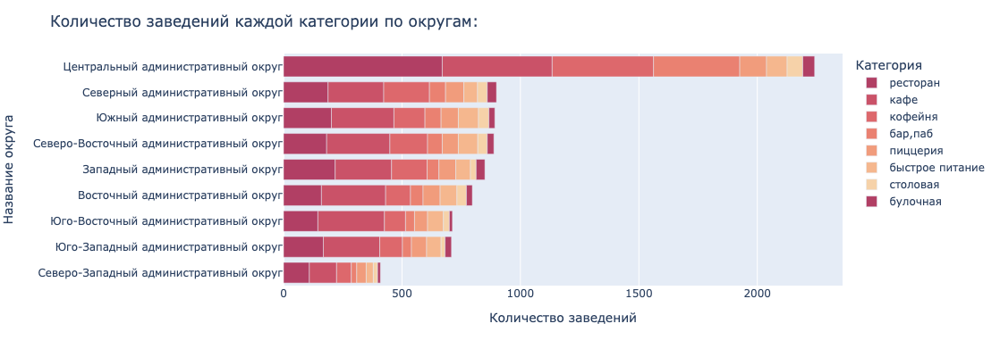

In [62]:
fig = px.bar(count_place_district,
             x='Количество заведений',
             y='Округ',
             color_discrete_sequence = px.colors.sequential.Redor[::-1],
             color='Категория',
             width=1000, height=400
            )
fig.update_layout(title='Количество заведений каждой категории по округам:',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название округа',
                   yaxis={'categoryorder':'total ascending'},
                  showlegend=True, legend_title='Категория'
                 )
fig.show()


<div style="border:solid pink 2px; padding: 20px">

**Вывод по п. 3.6**.
    
1) Видно, что **максимальное количество заведений** находится в **Центральном административном округе** - **2242** или **27%**, что логично, так как в центре обычно максимальная концентрация заведений - общественного питания, развлечений, торговых центров, музеев и т.д.
    
2) Интересно то, что категория заведений **'кафе'** представлена во всех районах как лидер среди других категорий, кроме Центрального округа.
    
3) Меньше всего заведений представлено в **Северо-Западном административном округе** - **409** или **5%** от общего количества. Такое количество заведений может быть вызвано географической особенностью округа. Более 46 % площади Северо-Западного административного округа занимают природные ландшафты — лесопарковые массивы, водоёмы, заповедные зоны (Источник - https://dzen.ru/a/ZSSsygHSfDZkMr1T)
    
4) Во всех округах в **ТОП-3** заведений входят **кафе, рестораны и кофейни**. Эти категории заведений привлекают самую расширенную целевую категорию.
    
5) **Баров** больше всего в **Центральном округе**. Есть вероятность, что в центре безопаснее распивать настойки или алкоголь, чем где-то на окраине, а также в центре больше всего туристических мест и улиц, что повышает количество заведений разных категорий в целом.
    
6) Всего представлено 9 администативных округов.    
    
</div>

### 3.7 Распределение средних рейтингов по категориям заведений.  <a class="tocSkip"> 

Найдем средний рейтинг заведений по категориям:

In [63]:
category_rating = moscow_places.groupby('category').agg({'rating' : 'mean'}).round(2).sort_values('rating', ascending = False).reset_index()
category_rating = category_rating.rename(columns = {'category': 'Категория', 'rating': 'Рейтинг'})
category_rating.set_index('Категория')

,Рейтинг
Категория,
"бар,паб",4.39
пиццерия,4.30
ресторан,4.29
кофейня,4.28
булочная,4.27
столовая,4.21
кафе,4.12
быстрое питание,4.05


Визуализируем данные:

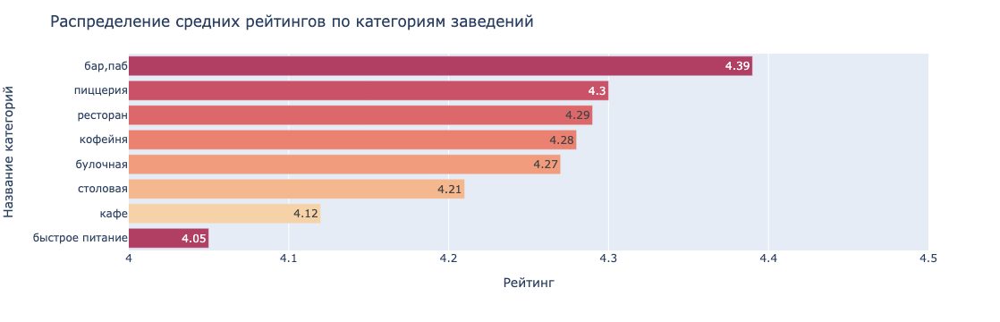

In [64]:
fig = px.bar(category_rating,
             x='Рейтинг',
             y='Категория',
             text='Рейтинг',
             color_discrete_sequence = px.colors.sequential.Redor[::-1], 
             color='Категория'                   
            )

fig.update_layout(title='Распределение средних рейтингов по категориям заведений',
                   xaxis_title='Рейтинг',
                   yaxis_title='Название категорий',
                  showlegend=False)
fig.update_xaxes(range=[4, 4.5])
fig.show()

Средний рейтинг превышает 4 балла. Самый высокий рейтинг у баров и пабов, что может быть вызвано необычным дизайном или индивидуальным подходом.

Практически одинаковый рейтинг имеют пиццерии, рестораны, кофейни и булочные. 

Самый низкий рейтинг у заведений быстрого питания. Этот рейтинг может быть сформирован в результате большого количества маленьких частных точек, где нет красивой атмосферы, должного контроля, высокого уровня сервиса и т.д.

Посмотрим средний рейтинг заведений по округам:

In [65]:
district_rating = moscow_places.groupby('district', as_index=False)['rating'].agg('mean').round(2).sort_values('rating', ascending = False)
district_rating = district_rating.rename(columns = {'district': 'Округ', 'rating': 'Рейтинг'})
district_rating.set_index('Округ')

,Рейтинг
Округ,
Центральный административный округ,4.38
Северный административный округ,4.24
Северо-Западный административный округ,4.21
Западный административный округ,4.18
Южный административный округ,4.18
Восточный административный округ,4.17
Юго-Западный административный округ,4.17
Северо-Восточный административный округ,4.15
Юго-Восточный административный округ,4.10


Самый высокий рейтинг заведений - в Центральном округе, самый низкий - в Юго-Восточном.

Посмотрим значения в разрезе категорий с помощью тепловой карты:

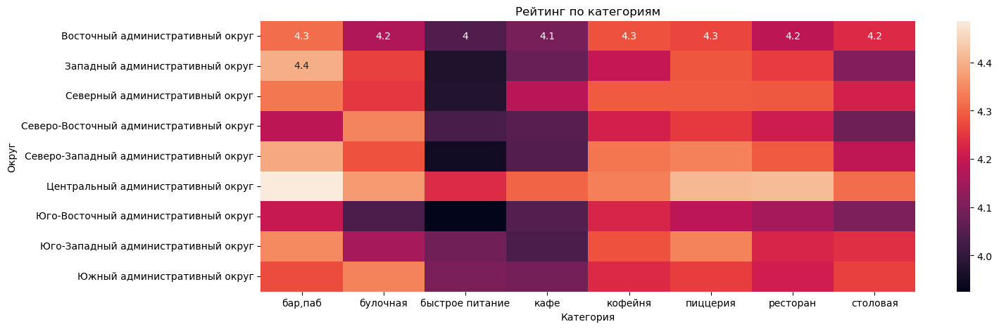

In [66]:
rating_cat = moscow_places.pivot_table(index='district', columns='category', values='rating', aggfunc='mean')
plt.figure(figsize=(15,5))
plt.title('Рейтинг по категориям')
sns.heatmap(rating_cat, annot=True)
plt.xlabel('Категория')
plt.ylabel('Округ')
plt.show()

<div style="border:solid pink 2px; padding: 20px">

**Вывод по п. 3.7**.
    
1) Средние рейтинги в разных типах общепита различаются несильно - разброс от **3.9 до 4.5**.
    
2) Самые **высокие** рейтинги у **баров** в **Центральном административном округе**.
    
3) Самые **низкие** рейтинги у заведений **быстрого питания** в **Юго-Восточном и Северо-Западном** административных округах.    
    
</div>

### 3.8 Хороплет со средним рейтингом заведений каждого района.  <a class="tocSkip"> 

Так как границы районов Москвы находятся в стороннем json файле, необходимо импортировать json:

In [67]:
with open('/Users___l_geomap.geojson', 'r') as geomap:
    geomap_json = json.load(geomap)

Загружаем границы округов Москвы и добавляем ее координаты:

In [68]:
moscow_geomap= '/Users___l_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

Создаем карту Москвы с округами:

In [69]:
moscow_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Создаем хороплет:

In [70]:
Choropleth(
    geo_data=moscow_geomap,
    data=district_rating,
    columns=['Округ', 'Рейтинг'],
    key_on='feature.name',
    fill_color='RdBu_r',
    legend_name='Медианный рейтинг заведений по округам',
).add_to(moscow_map)

moscow_map

<div style="border:solid pink 2px; padding: 20px">

**Вывод по п. 3.8**.
    
Карта подтверждает ранее сформулированные факты - в **Центральном округе самый высокий рейтинг** и **самый низкий - в Юго-Восточном округе**.    
    
</div>

### 3.9 Все заведения датасета на карте. <a class="tocSkip"> 

С помощью кластеров средствами библиотеки folium добавим все заведения на карту.

Для этого создаем кластер и добавляем его на карту:

In [71]:
moscow_map_1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

In [72]:
marker_cluster = MarkerCluster().add_to(moscow_map_1)

Введем функцию, которая создаст маркер и добавит его кластеп:

In [73]:
def clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['category']}",
    ).add_to(marker_cluster)

In [74]:
moscow_places.apply(clusters, axis=1)
moscow_map_1

<div style="border:solid pink 2px; padding: 20px">

**Вывод по п. 3.9**.
    
Самое большое количество заведений находится в **Центральном округе**.
    
</div>

### 3.10 Топ-15 улиц по количеству заведений. <a class="tocSkip"> 

Создадим таблицу с ТОП-15 улиц по количеству заведений:

In [75]:
streets_top_15 = moscow_places.groupby('street')['name'].agg('count').reset_index()
streets_top_15 = streets_top_15.sort_values('name', ascending=False).head(15)
streets_top_15 = streets_top_15.rename(columns = {'street': 'Название улицы', 'name': 'Количество заведений'})
streets_top_15.set_index('Название улицы')

,Количество заведений
Название улицы,
проспект Мира,182
Профсоюзная улица,122
проспект Вернадского,108
Ленинский проспект,107
Ленинградский проспект,95
Дмитровское шоссе,88
Каширское шоссе,77
Варшавское шоссе,76
Ленинградское шоссе,70


Создадим таблицу с категориями заведений:

In [76]:
cat_streets = moscow_places.groupby(['street', 'category'])['name'].count().reset_index()
cat_streets.columns = ['Название улицы', 'Категория', 'Количество заведений']
cat_streets.sort_values('Количество заведений', ascending=False)

,Название улицы,Категория,Количество заведений
2860,проспект Мира,кафе,52
1380,МКАД,кафе,45
2863,проспект Мира,ресторан,45
2861,проспект Мира,кофейня,36
1989,Профсоюзная улица,кафе,35
...,...,...,...
1531,Моховая улица,"бар,паб",1
1533,Мукомольный проезд,булочная,1
1534,Мукомольный проезд,быстрое питание,1
1535,Мукомольный проезд,пиццерия,1


Из всего списка улиц выберем только те, что в датафрейме ТОП-15 улиц (streets_top_15)

In [77]:
str_top_15_cat = cat_streets[cat_streets['Название улицы'].isin(streets_top_15['Название улицы'])]
str_top_15_cat

,Название улицы,Категория,Количество заведений
683,Варшавское шоссе,"бар,паб",6
684,Варшавское шоссе,быстрое питание,7
685,Варшавское шоссе,кафе,18
686,Варшавское шоссе,кофейня,14
687,Варшавское шоссе,пиццерия,4
...,...,...,...
3434,улица Миклухо-Маклая,быстрое питание,4
3435,улица Миклухо-Маклая,кафе,21
3436,улица Миклухо-Маклая,кофейня,4
3437,улица Миклухо-Маклая,пиццерия,2


Создадим визуализацию - столбчатый график с количеством заведений каждой категории по округам:

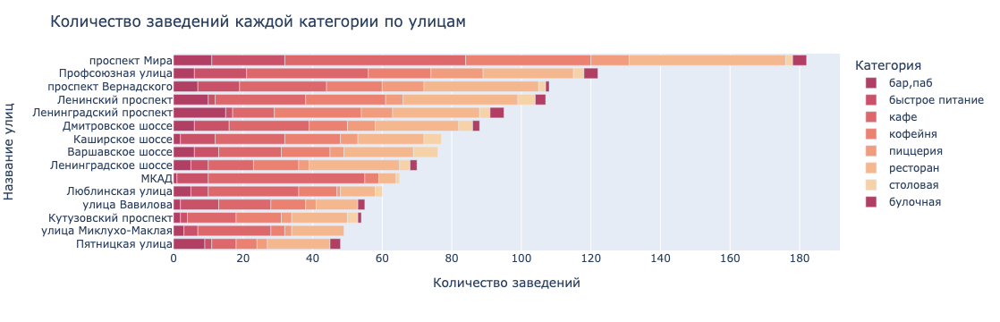

In [78]:
fig = px.bar(str_top_15_cat,
             x='Количество заведений',
             y='Название улицы',
             color_discrete_sequence = px.colors.sequential.Redor[::-1],                   
             color='Категория'
            )

fig.update_layout(title='Количество заведений каждой категории по улицам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название улиц',
                   yaxis={'categoryorder':'total ascending'}
                 )
fig.show()

<div style="border:solid pink 2px; padding: 20px">

**Вывод по п. 3.10**.
    
1) Самое большое количество заведений находится на **проспекте Мира** - **182 заведения**. Больше 100 заведений также находится на **Профсоюзной улице, проспекте Вернадского, Ленинском проспекте**.
    
2) Интересно, что **кафе** больше всего на **проспекте Мира и на МКАД**. На проспекте Мира в целом много заведений, так как это одна из самых длинных московских артерий, ее длина составляет 8,9 километра. Причина большого количества кафе на МКАД - развитая инфраструктура, а также то, что МКАД является частью Европейских и Азиатских маршрутов. Поэтому, как и на любой трассе, здесь кафе больше, чем на стандартных улицах Москвы.
    
3) Практически все улицы в ТОП-15 являются длинными, кроме Пятницкой улицы (1.8 км). Однако зависимости между длинной улиц и количеством заведений нет. Так, например, на самой длинной улице МКАД 65 заведений (45 из них кафе), а на проспекте Мира длиной 8.9 км заведений больше, чем на Профсоюзной улице длиной 9.3 км.     
    
</div>

### 3.11 Улицы с одним объектом общепита. <a class="tocSkip"> 

Посмотрим, какое количество улиц, где назодится один объект общепита:

In [79]:
one = moscow_places.pivot_table(index='street', values='name', aggfunc='count').sort_values(by='name').reset_index()
one = one[one['name'] == 1]
len(one)

458

Всего в выборке представлено 458 улиц с одним объектом общепита. 

Посмотрим, какие категории обычно представлены на этих улицах:

In [80]:
street_category = cat_streets[cat_streets['Название улицы'].isin(one.index)]
street_category = street_category.groupby('Категория')['Название улицы'].count().reset_index()
street_category.columns = ['Категория', 'Количество улиц']
street_category = street_category.sort_values('Количество улиц', ascending=False)
street_category.set_index('Категория')

,Количество улиц
Категория,


/Users/liza_kuzminykh/anaconda3/lib/python3.11/site-packages/seaborn/matrix.py:260: FutureWarning:

Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior



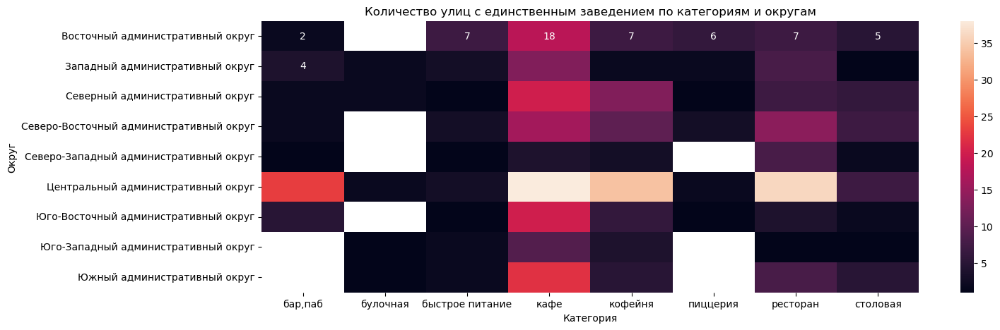

In [81]:
one_street = one['street']
one_street_district = moscow_places.query('street in @one_street')
one_street_district_map = one_street_district.pivot_table(index = 'district', columns='category', values='rating', aggfunc='count') 


plt.figure(figsize=(15,5))
plt.title('Количество улиц с единственным заведением по категориям и округам')
sns.heatmap(one_street_district_map, annot=True)
plt.xlabel('Категория')
plt.ylabel('Округ')
plt.show()

<div style="border:solid pink 2px; padding: 20px">

**Вывод по п. 3.11**.
    
1) Самое большое число улиц с единственным заведением представлено в **Центральном округе** - преимущественно это улицы с **кафе, ресторанами и кофейнями**.

2) Также из округов выделяется **Северо-Восточный административный округ и Северный административный округ**.

3) Говоря о категориях, можно выделить **кафе** - это самая популярная категория во всех округах. Больше всего улиц с единственным кафе в Центральном, Южном, Юго-Восточном и Северном административных округах. 
   
4) Всего в данных **458 улиц**, где представлено единственное заведение. 
    
</div>

### 3.12 Данные о средних чеках. <a class="tocSkip"> 

Проанализируем столбец `middle_avg_bill` и посчитаем медиану для каждого района.

In [82]:
median_avg_bill = moscow_places.groupby('district')['middle_avg_bill'].agg('median').reset_index()
median_avg_bill = median_avg_bill.sort_values('middle_avg_bill', ascending = False)
median_avg_bill = median_avg_bill.rename(columns = {'district': 'Округ', 'middle_avg_bill': 'Медиана среднего чека'})
median_avg_bill.set_index('Округ')

,Медиана среднего чека
Округ,
Западный административный округ,1000.0
Центральный административный округ,1000.0
Северо-Западный административный округ,700.0
Северный административный округ,650.0
Юго-Западный административный округ,600.0
Восточный административный округ,575.0
Северо-Восточный административный округ,500.0
Южный административный округ,500.0
Юго-Восточный административный округ,450.0


Из данных видим, что медиана самого высокого среднего чека в Западном и Центральном округах, самая низкая - в Юго-Восточном административном округе.

Посмотрим ценовую политику заведений на карте:

In [83]:
moscow_map_2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

In [84]:
Choropleth(
    geo_data = moscow_geomap,
    data = median_avg_bill,
    columns=['Округ', 'Медиана среднего чека'],
    key_on='feature.name',
    fill_color='RdBu_r',
    legend_name='Медианный рейтинг ценовой политики заведений по округам',
).add_to(moscow_map_2)

moscow_map_2

<div style="border:solid pink 2px; padding: 20px">

**Вывод по п. 3.12**.
    
1) Самая высокая ценовая политика наблюдается в 2-х округах Москвы - **Центральном и Западном**. Исторически сложилось, что любой центральный район всегда имеет высокие цены на жилье, развлечения, питание и т.д. Интересно, что такой же высокий ценник в Западном округе. Это может быть вызвано большим количеством крупных парков: Москворецкий, Филёвский, Суворовский, парк Победы, парк развлечений Сказка, природный заказник долина реки Сетунь, природный заказник Воробьёвы горы, парк 50-летия Октября, парк Олимпийской деревни, Тропарёвский парк.
   Также в Западном округе расположены следущие достопримечательности: усадьба Нарышкиных в Суворовском парке, монумент Победы на Поклонной горе, Триумфальная арка, Бородинская панорама, самая высокая сталинская высотка – Московский Государственный Университет. 
    Западный округ считается одним из самых экологически чистых в Москве. Также данный округ включает в себя территорию аэропорта Внуково, где традиционно цены выше, чем в заведениях на улицах города. 
    
2)Всегда цены в заведениях выше в центре, чем в отдаленных от центра заведениях. Однако, в конкретном случае можно сделать следующее предположение, что стоимость зависит от уровня заведения и от уровня округа. В Западном округе меньше заведений, чем в Восточном и Юго-Восточном округах, но при этом средний чек выше и уровень жизни выше.      
    
</div>

<div style="border:solid blue 3px; padding: 20px">
    
**Вывод по п. 3**. 
    
1) **Москва** - гастрономическая столица. Неудивительно, что в ней представлено много заведений как сетевых, так и несетевых. По данным сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года численность заведений общественного питания в Москве составляла **8399 заведения** (после удаления дубликатов).
    
2)Среди категорий заведений общественного питания преобладают:
* **кафе**	2373
* **ресторан**	2042
* **кофейня**	1413
    
Меньше всего представлено **столовых и булочных** - 315 и 256 соответственно.
    
Причиной большого количества кафе и ресторанов может служить разнообразное меню, подходящее под различные целевые аудитории и покрывающие разный возраст гостей. Столовые и булочные покрывают не все категории гостей.    

2)  ТОП-3 объектов общественного питания по медианному количеству посадочных мест составляют **рестораны, бары и кофейни**. Самое маленькое количество мест у категорий "пиццерия" и "булочная". 
    
3) Заведения в основном **несетевые** - 62% от всего количества.
    
4) Среди сетевых заведений в ТОП входит **"Шоколадница"** - 120 заведений сети, что существенно больше по сравнению с другими сетями, на втором и третьем местах расположились пиццерии - **Домино'с пицца и Додо пицца**.
    
5) Интересно, что сетевые кафе, рестораны и кофейни имеют практически одинаковое количество заведений.
    
6) Максимальное количество заведений представлено в **Центральном округе**, минимальное - в **Северо-Западном**. 
    
7) Во всех округах кроме Центрального среди всех категорий преобладают кафе, в Центральном - рестораны. 
    
8) По среднему рейтингу заметно отрывается категория **баров и пабов - 4.39**, когда как следующие за ней пиццерии и рестораны имеют рейтинг 4.29 и 4.28, соответственно. 
    
9) Самые высокие рейтинги заведений - в **Центральном округе**, затем - в Южном, низкие - в Юго-Восточном. 
    
10) Значительно выделяется по количеству заведений **Проспект Мира**,где находится 182 заведения. Также на следующих улицах находится более 100 заведений: 
* **проспект Мира**	182
* **Профсоюзная улица**	122
* **проспект Вернадского**	108
* **Ленинский проспект**	107
    
Меньше всего заведений находится на улице Миклухо-Маклая (49) и Пятницкой улице (48).
    
11) Самое большое число улиц с единственным заведением представлено в **Центральном округе** - преимещуственно это улицы с кафе, ресторанами и кофейнями.

12) Говоря о категориях, можно выделить **кафе** - это самая популярная категория во всех округах. Больше всего улиц с единственным кафе в Центральном, Южном, Юго-Восточном и Северном административных округах.

13) Всего в данных **458 улиц**, где представлено единственное заведение. 
    
14) Самая высокая ценовая политика наблюдается в 2-х округах Москвы - **Центральном и Западном**. Там медиана среднего чека составляет **1000 рублей**, самая низкая медиана среднего чека в **Юго-Восточном округе** - **450 рублей**.   
     
</div>

## 4. Открытие кофейни.

### 4.1 Количество кофеен. <a class="tocSkip"> 

Посчитаем количество кофеен в датасете:

In [85]:
coffeeshop = moscow_places[moscow_places['category'] == 'кофейня']
print('Количество кофеен в датасете:' , len(coffeeshop))

Количество кофеен в датасете: 1413


Всего в датасете представлено 1413 кофеен, посмотрим, в каком округе больше всего кофеен. Построим таблицу с количеством кофеен в каждом округе. 

In [86]:
coffeeshop_district = coffeeshop.groupby('district')['name'].agg('count').reset_index()
coffeeshop_district = coffeeshop_district.sort_values('name', ascending=False)
coffeeshop_district = coffeeshop_district.rename(columns = {'district': 'Округ', 'name': 'Количество кофеен'})
coffeeshop_district.set_index('Округ')

,Количество кофеен
Округ,
Центральный административный округ,428
Северный административный округ,193
Северо-Восточный административный округ,159
Западный административный округ,150
Южный административный округ,131
Восточный административный округ,105
Юго-Западный административный округ,96
Юго-Восточный административный округ,89
Северо-Западный административный округ,62


Добавим колонку с % для информативности данных:

In [87]:
coffeeshop_district['Доля кофеен'] = (coffeeshop_district['Количество кофеен']/(coffeeshop_district['Количество кофеен'].sum())*100).round(1)
coffeeshop_district.set_index('Округ')

,Количество кофеен,Доля кофеен
Округ,,
Центральный административный округ,428,30.3
Северный административный округ,193,13.7
Северо-Восточный административный округ,159,11.3
Западный административный округ,150,10.6
Южный административный округ,131,9.3
Восточный административный округ,105,7.4
Юго-Западный административный округ,96,6.8
Юго-Восточный административный округ,89,6.3
Северо-Западный административный округ,62,4.4


Видим, что больше всего кофеен представлено в Центральном округе - более 30% от всего количества. Меньше всего - в Северо-Западном округе - чуть более 4%. 

Визуализируем данные:

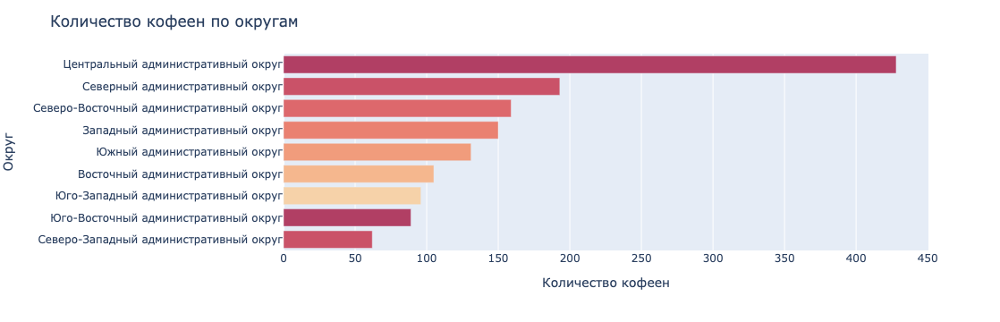

In [88]:
fig = px.bar(coffeeshop_district,
             x='Количество кофеен',
             y='Округ',
             color_discrete_sequence = px.colors.sequential.Redor[::-1],                   
             color='Округ'
            )

fig.update_layout(title='Количество кофеен по округам',
                   xaxis_title='Количество кофеен',
                   yaxis_title='Округ',
                   yaxis={'categoryorder':'total ascending'},
                  showlegend=False)
                 
fig.show()

<div style="border:solid pink 2px; padding: 20px">

**Вывод по п. 4.1**.
    
1) Всего в датасете представлено **1413** заведений категории "кофейня", из них **428 (или 30%)** находятся в **Центральном округе**, что логично, учитывая количество офисных зданий и достопримечательностей в центре.
    
2) **193 или чуть меньше 14%** всех кофеен расположено в **Северном административном округе**. САО богат достопримечательностями, здесь находятся: усадьбы Михалково и Грачёвка, здание Северного речного вокзала, Петровский путевой дворец, Московский ипподром, Ходынское поле,а также самый большой торговый центр Москвы – Авиапарк. 
    
3) Меньше всего кофеен расположено в **Северо-Западном административном округе** - всего **62 кофейни (4% от всего количества)**. Более 46 % площади Северо-Западного административного округа занимают природные ландшафты — лесопарковые массивы, водоёмы, заповедные зоны, что могло повлиять на количество заведений общественного питания в целом.   
     
</div>

### 4.2 Часы работы кофеен. <a class="tocSkip"> 

Найдем кофейни, которые работают круглосуточно. 

In [89]:
coffeeshop_24_7 = moscow_places[(moscow_places['category'] == 'кофейня')&(moscow_places['is_24/7'] == True)]
print('Количество круглосуточных кофеен:', len(coffeeshop_24_7))

Количество круглосуточных кофеен: 59


Всего 59 кофеен работают круглосуточно. Посмотрим, сколько из них находится в разных округах:

In [90]:
coffeeshop_24_7_district = coffeeshop_24_7.groupby('district')['name'].agg('count').reset_index()
coffeeshop_24_7_district = coffeeshop_24_7_district.sort_values('name', ascending = False)
coffeeshop_24_7_district = coffeeshop_24_7_district.rename(columns = {'district': 'Округ', 'name': 'Количество круглосуточных кофеен'})
coffeeshop_24_7_district.set_index('Округ')

,Количество круглосуточных кофеен
Округ,
Центральный административный округ,26
Западный административный округ,9
Юго-Западный административный округ,7
Восточный административный округ,5
Северный административный округ,5
Северо-Восточный административный округ,3
Северо-Западный административный округ,2
Юго-Восточный административный округ,1
Южный административный округ,1


Добавим доли:

In [91]:
coffeeshop_24_7_district['Доля кофеен'] = (coffeeshop_24_7_district['Количество круглосуточных кофеен']/ (coffeeshop_24_7_district['Количество круглосуточных кофеен'].sum())*100).round(0)
coffeeshop_24_7_district.set_index('Округ')

,Количество круглосуточных кофеен,Доля кофеен
Округ,,
Центральный административный округ,26,44.0
Западный административный округ,9,15.0
Юго-Западный административный округ,7,12.0
Восточный административный округ,5,8.0
Северный административный округ,5,8.0
Северо-Восточный административный округ,3,5.0
Северо-Западный административный округ,2,3.0
Юго-Восточный административный округ,1,2.0
Южный административный округ,1,2.0


Логично, что в Центральном округе находится больше всего круглосуточных кофеен, так как их изначально представлено более 420 заведений. 

Интересно, что второй по количеству кофеен - Северный административный округ - имеет только 5 круглосуточных кофеен, а в Западном округе, где на 40 кофеен меньше, чем в Северном - круглосуточных кофеен больше на 4. 

Меньше всего круглосуточных кофеен в Южном и Юго-Восточном округе. В целом, маленькое количеством круглосуточных кофеен логично, так как в основном гости пьют кофе в утреннее - обеденное время. 

Построим визуализацию на карте:

In [92]:
moscow_map_3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

In [93]:
Choropleth(
    geo_data = moscow_geomap,
    data = coffeeshop_24_7_district,
    columns=['Округ', 'Количество круглосуточных кофеен'],
    key_on='feature.name',
    fill_color='RdBu_r',
    legend_name='Количество круглосуточных кофеен',
).add_to(moscow_map_3)

moscow_map_3

Посмотрим, какие названия заведений являются круглосуточными и есть ли среди них сетевые заведения:

In [94]:
coffeeshop_24_7_chain = coffeeshop_24_7.groupby('chain')['name'].agg('count').reset_index()
coffeeshop_24_7_chain = coffeeshop_24_7_chain.rename(columns = {'chain': 'Тип заведения', 'name': 'Количество круглосуточных заведений'})
coffeeshop_24_7_chain['Тип заведения'] = coffeeshop_24_7_chain['Тип заведения'].replace({False: 'Несетевые', True: 'Сетевые'})
coffeeshop_24_7_chain.set_index('Тип заведения')                                                                              

,Количество круглосуточных заведений
Тип заведения,
Несетевые,9
Сетевые,50


50 круглосуточных кофеен являются сетевыми. Посмотрим, какие именно сети представлены в этой выборке:

In [95]:
coffeeshop_24_7 = moscow_places[(moscow_places['category'] == 'кофейня')&(moscow_places['is_24/7'] == True)&(moscow_places['chain'] == True)]
coffeeshop_24_7

coffeeshop_24_7_type_chain = coffeeshop_24_7.groupby('name')['name'].count()
coffeeshop_24_7_type_chain

name
cinnabon               1
cofix                  2
one price coffee       1
one&double             1
the wild bean cafe     1
wild bean              5
wild bean cafe         6
you&coffee             2
кофе с собой           2
кофе хауз              3
кофемания              8
пирог хауз             1
шоколадница           17
Name: name, dtype: int64

Из данных видно, что у нас есть разные наименования одной и той же сети - the wild bean cafe, wild bean и wild bean cafe. В сумме они составляют 12 заведений, однако, на текущий момент, этот дубляж не влияет на результаты.

Самое большое количество круглосуточных кофеен представлено у "Шоколадницы". Могу предположить, что они могут находиться в круглосуточных торговых центрах или аэропортах.

<div style="border:solid pink 2px; padding: 20px">

**Вывод по п. 4.2**.
    
1) Всего в датасете представлено **59** круглосуточно работающих кофеен. 
    
2) 26 из 59 кофеен расположены в **Центральном округе**. Меньше всего круглосуточных кофеен в **Южном и Юго-Восточном округе**. 
    
3) **50 круглосуточных кофеен** из 59 являются **сетевыми**, где представлено только 17 заведений сети 'Шоколадница'.     
    
</div>

### 4.3 Рейтинг кофеен. <a class="tocSkip"> 

Посмотрим, какие рейтинги у кофеен более подробно:

In [96]:
coffeeshop_rating = coffeeshop.groupby('district')['rating'].agg('mean').reset_index()
coffeeshop_rating = coffeeshop_rating.round(2).sort_values('rating', ascending=False)
coffeeshop_rating = coffeeshop_rating.rename(columns = {'district':'Округ', 'rating': 'Рейтинг'})
coffeeshop_rating.set_index('Округ')

,Рейтинг
Округ,
Центральный административный округ,4.34
Северо-Западный административный округ,4.33
Северный административный округ,4.29
Восточный административный округ,4.28
Юго-Западный административный округ,4.28
Юго-Восточный административный округ,4.23
Южный административный округ,4.23
Северо-Восточный административный округ,4.22
Западный административный округ,4.20


Построим визуализацию на карте:

In [97]:
moscow_map_4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

In [98]:
Choropleth(
    geo_data = moscow_geomap,
    data = coffeeshop_rating,
    columns=['Округ', 'Рейтинг'],
    key_on='feature.name',
    fill_color='RdBu_r',
    legend_name='Рейтинг кофеен по округам',
).add_to(moscow_map_4)

moscow_map_4

<div style="border:solid pink 2px; padding: 20px">

**Вывод по п. 4.3**.
    
1) Самый высокий рейтинг у кофеен, находящихся в **Центральном и Северо-Западном округах - 4.34 и 4.33** соответственно. В Центральном округе высокая конкуренция и заведения стремятся повысить свой рейтинг. Что касается Северо-Западного округа, интересно, что там меньше всего кофеен - всего 62, но при этом высокий ценник -сразу идет после Центрального и Западного округов по ценовой политике. 
    
2) Самый низкий рейтинг у кофеен в **Западном округе - 4.20**. 
    
    
</div>

### 4.4 Стоимость чашки кофе. <a class="tocSkip"> 

Посмотрим, сколько стоит чашка кофе в среднем в датасете:

In [99]:
moscow_places['middle_coffee_cup'].describe() 

count     535.000000
mean      174.721495
std        88.951103
min        60.000000
25%       124.500000
50%       169.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

Видим, что у нас представлено 535 чеков, где средней ценой чашки кофе является сумма в 174,7 рублей.
Минимальная сумма за чашку кофе - 60 рублей, максимальная - 1568 рублей.

Так как максимальная цена в несколько раз превышает минимальную, построим диаграмму размаха, чтобы посмотреть выбросы:

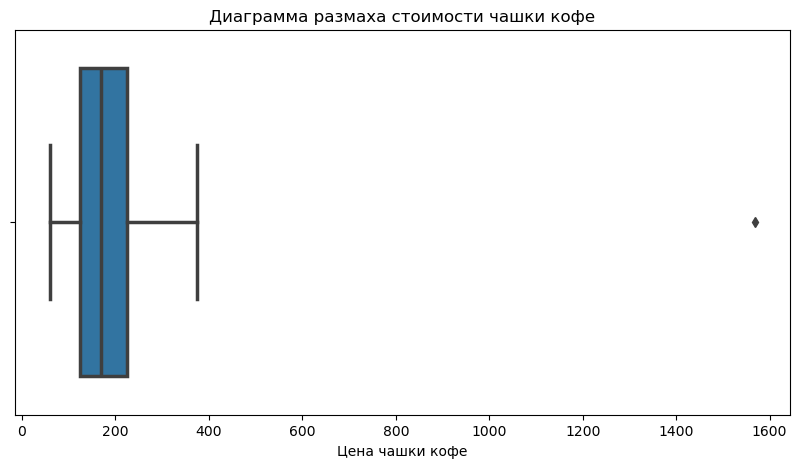

In [100]:
plt.subplots(figsize=(10,5))
sns.boxplot(x = 'middle_coffee_cup', data = moscow_places, linewidth=2.5)
plt.xlabel('Цена чашки кофе')
plt.title('Диаграмма размаха стоимости чашки кофе')
plt.show()

Из диаграммы видим, что у нас есть выброс, а именно максимальная стоимость чашки кофе. Удалим выбросы и посмотрим среднюю стоимость чашки кофе по округам:

In [101]:
coffeeshop = coffeeshop[coffeeshop['middle_coffee_cup']<=1500]
coffeeshop['middle_coffee_cup'].describe()

count    520.000000
mean     172.376923
std       65.767854
min       60.000000
25%      124.000000
50%      169.500000
75%      225.000000
max      375.000000
Name: middle_coffee_cup, dtype: float64

Удалили выбросы и сейчас у нас самая высокая цена на чашку кофе - 375 рублей, а средняя стоимость - 172 рубля. Посмотрим ценовую политику по округам:

In [102]:
coffee_cup_district = coffeeshop.groupby('district')['middle_coffee_cup'].agg('mean').round(1).reset_index().sort_values('middle_coffee_cup', ascending = False)
coffee_cup_district = coffee_cup_district.rename(columns = {'district': 'Округ', 'middle_coffee_cup': 'Средняя цена чашки кофе'})
coffee_cup_district.set_index('Округ')

,Средняя цена чашки кофе
Округ,
Западный административный округ,189.9
Центральный административный округ,187.5
Юго-Западный административный округ,184.2
Северный административный округ,165.8
Северо-Западный административный округ,165.5
Северо-Восточный административный округ,165.3
Южный административный округ,158.5
Юго-Восточный административный округ,151.1
Восточный административный округ,140.0


Из таблицы видим, что самые высокие цены чашки кофе наблюдаются в 3-х округах: Западном, Центральном и Юго-Западном. 

Средняя стоимость может быть выше в Западном округе, так как в нем находится аэропорт Внуково, где цены выше, чем обычно.

В Центральном округе логично, что стоимость чашки кофе будет дороже, так как может сказываться дорогая аренда помещений. 

В Юго-Западном округе преобладает большое количество парков, прогулочных зон. Также он считается престижным районом благодаря наличию научно-исследовательских институтов, научно-производственных комплексов и экологической обстановке.

Самый низкий ценник в Восточном округе, что неудивительно, так как он считается одним из самых криминальных. Магазины, торговые центры в основном направлены на эконом-класс. Однако, ближе к центру такие районы округа как Преображенский, Сокольники и Измайлово считаются престижными для проживания. 

Визуализируем данные на карте:

In [103]:
moscow_map_5 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

In [104]:
Choropleth(
    geo_data = moscow_geomap,
    data = coffee_cup_district,
    columns=['Округ', 'Средняя цена чашки кофе'],
    key_on='feature.name',
    fill_color='RdBu_r',
    legend_name='Рейтинг средней стоимости чашки кофе по округам',
).add_to(moscow_map_5)

moscow_map_5

<div style="border:solid pink 2px; padding: 20px">

**Вывод по п. 4.4**.
    
1) С помощью диаграммы размаха увидели выбросы и удалили их из выборки, чтобы посчитать среднюю стоимость чашки кофе. Всего **было удалено 15 выбросов**.
    
2) **Средняя стоимость чашки кофе** - **172 рубля**.
    
3) Самые высокие цены на чашку кофе в **Западном, Юго-Западном и Центральном округах**. Причиной этому стали несколько факторов:
* положение округа, где большой поток туристов
* экология
* наличие аэропортов
* количество парков и прогулочных зон
* контингент живущих людей и их платежеспособность
    
Все это влияет на цену чашки кофе. 
    
4) Самая низкая средняя цена на чашку кофе замечена в **Восточном округе**, что может быть связано с наличием домов эконом-класса, криминальной историей, и платежеспособностью жителей.    
    
    
</div>

<div style="border:solid blue 3px; padding: 20px">
    
**Вывод по п. 4**. 
    
1) Всего в датасете представлено **1413 кофеен**. Из них порядка 30% расположены в **Центральном округе**, а 4% - в **Северо-Западном**. 
    
2) Всего **59 кофеен работают круглосуточно**, из них 50 являются сетевыми. Большая часть круглосуточных кофеен находится в **Центральном округе - 26 заведений**. Меньше всего круглосуточных кофеен в **Южном и Юго-Восточном округе - по 1 кофейне** соответственно. Из этого можно сделать вывод, что круглосуточные кофейни непопулярны, так как от всего количества кофеен занимают лишь 4.2%.  
    
3) Самый высокий рейтинг у кофеен в **Центральном, Северо-Западном округе**. Логично, что в Центральном округе много разного типа заведений и чтобы повысить рейтинг, кофейни должны предлагать не только вкусные напитки и хороший сервис, но и отличительные черты, которые позвляют выделить их среди массы других заведений. Удивительно, что в Северо-Западном округе всего насчитывается 62 кофейни, однако, они имеют высокий средний рейтинг, практически как и заведения в Центральном округе. 
    
4) Самый высокий средний чек на чашку кофе наблюдается в **Западном округе (189.9)**, однако, эти заведения имеют самый низкий средний рейтинг среди остальных округов. Возможно, ценовая политика не дает того сервиса, который ожидают жители Западного округа.
    
   Также высокий чек наблюдается в Центральном (187.5) и Юго-Западном (184.2) округах. Самый низкий средний чек - в Восточном округе (140.0) 
    
    
**Рекомендации по открытию кофейни:**
    
   
    
**1) Округ**.
    
* Центральный округ - самый популярный для открытия бизнеса, связанного с общественным питанием. В нем самое большое число заведений, однако, заказчик не боится конкуренции. Поэтому рекомендация - открыть кофейню в Центральном округе, но перед этим решением проанализировать более детально отдельные кофейни, которые имеют высокие рейтинги, и подготовить концепцию, которая будет сочетать историю их успеха, а также выделять на фоне других.
    
* В Северном административном округе также много заведений. В этом округе выделяются 3 района: Сокол, Аэропорт, Ховрино. Эти районы исторически привлекали научную и творческую интеллигенцию, поэтому их можно рассмотреть как вариант размещения кофейни в стиле сериала 'Друзья'. Кофейни данного округа имеют высокий средний рейтинг - 4.3. Поэтому это может быть отличным вариантом размещения.
    
* Еще один вариант - Южный округ. В нем самая высокая плотность населения среди других округов. Среди районов можно рассмотреть следующие: Донской, Даниловский и Нагатинский Затон. Это самые благополучные районы. Также в целом в округе есть несколько учебных заведений, среди которых Московский политехнический университет, Российский университет транспорта (РУТ), Московский финансово-юридический университет (МФЮА), Национальный исследовательский ядерный университет «МИФИ» и др.
    
**2) График работы**.
    
* Можно рассмотреть формат круглосуточной кофейни в Центральном округе, так как они привлекает не только жителей, но и туристов, которые могут быть активны и днем, и ночью.
* Если план открыть кофейню в альтернативном округе, то лучше установить ранние часы открытия, например, с 7.00. Так как многие работают с 8 утра, у них будет возможность зайти и позавтракать с утра. 

**3) Формат работы**.
    
* Обязательно добавить опцию 'кофе с собой'.
* Добавить опцию завтраков разного вида: вегетарианский, плотный и т.д.   
* В начале можно внедрить одну или несколько скидок для привлечения аудитории. 
    
**4) Ценовая политика**.

* Ориентироваться на цены в выбранном округе. В Центральном округе можно установить цену за чашку кофе от 180-230 рублей.
* В Северном округе - от 160-210 рублей.
* В Южном округе - от 155-200 рублей.    
              
</div>

# Общий вывод исследования

<div style="border:solid blue 4px; padding: 20px">
    
В ходе исследования, обработки и анализа данных были выявлены следующие особенности рынка заведений общественного питания Москвы:
    
1) Москва - не только столица России, но еще и город культурного и гастрономического разнообразия. В датасете представлено **8399 заведений** разных категорий - бары, рестораны, кофейни, кафе, столовые и т.п
    
2) ТОП-3 категории - **кафе, рестораны и кофейни** - занимают **69%** от всего количества заведений. 
    
Кафе и рестораны покрывают большую аудиторию, так как могут предоставить разнообразное меню, содержащее и продукты быстрого питания, и пиццы и булочные изделия, а также покрыть как кофейные, так и алкогольные напитки в барной карте.  

3) ТОП-3 объектов общественного питания по медианному количеству посадочных мест составляют **рестораны, бары и кофейни**, где 86, 82  80 мест, соответственно.
    
Самое маленькое количество мест у категорий **'пиццерия'** и **'булочная'**. Традиционно, эти категории заведений не предполагают, что люди будут проводить время внутри помещения - пиццу приятнее есть в компании друзей дома, а булочки - в кругу семьи.  
    
4) **Несетевые заведения** составляют **62%**, **сетевые** - **38%**.    
    
5) По абсолютным величинам больше всего заведений представлено в категориях **кафе (776), ресторан (729)** и **кофейня (720)**. Однако в разрезе относительных величин больше всего доля сетевых заведений у категорий **булочная (61%), пиццерия (52%)** и **кофейня (51%)**.    
    
6) В ТОП-15 популярных сетей входит несколько известных заведений. Из них больше всего заведений представлено в сети **'Шоколадница'** - **15%** от всего количества сетевых заведений. Также лидерами являются известные пиццерии: **Домино’c пицца (9.3%)** и **Додо Пицца (9.1%)**.  На 15-ом месте рейтинга находится сеть **'Му-му' (3.3%)**.    
    
7) В Москве находится **9 административных округов**:
* Северный административный округ,
* Северо-Восточный административный округ,
* Северо-Западный административный округ,
* Западный административный округ,
* Центральный административный округ,
* Восточный административный округ,
* Юго-Восточный административный округ,
* Южный административный округ,
* Юго-Западный административный округ.
 
**Центральный административный округ** имеет наибольшее количество заведений - **2242** или **27%** от всего количества, что логично, так как в центре обычно максимальная концентрация заведений - общественного питания, развлечений, торговых центров, музеев и т.д.
    
Меньше всего заведений представлено в **Северо-Западном административном округе** - **409** или **5%** от общего количества. Такое количество заведений может быть вызвано географической особенностью округа. Более 46 % площади Северо-Западного административного округа занимают природные ландшафты — лесопарковые массивы, водоёмы, заповедные зоны (Источник - https://dzen.ru/a/ZSSsygHSfDZkMr1T).   
    
8) **Кафе** - самая распространенная категория, она занимает первые места по количеству заведений во всех округах, кроме Центрального. 
    
В Центральном округе первое место занимают **рестораны**. В 7 округах лидерами являются: **кафе, рестораны, кофейни**. Только в Северном округе этот порядок немного иной: **кафе, кофейни и рестораны**. Больше всего **баров и пабов** находится в центре, там они занимают четвертое место после кофеен. 
    
9) Самые высокие рейтинги у **баров - 4.39**, что может быть вызвано необычным дизайном или индивидуальным подходом. 
    
Самые низкие - у заведений **быстрого питания - 4.05**. Этот рейтинг может быть сформирован в результате большого количества маленьких частных точек, где нет красивой атмосферы, должного контроля, высокого уровня сервиса и т.д. 
    
По округам, самый высокий рейтинг заведений в **Центральном округе - 4.38**, самый низкий - в **Юго-Восточном округе** - **4.10**. В Центральном округе высокая конкуренция ввиду большого количества заведений. Часто люди смотрят на рейтинг, выбирая то или иное заведение, поэтому заведения стараются выделяться, удивлять не только интерьером, но и превосходным сервисом.  С точки зрения экологии, Юго-Восточный округ считается неблагоприятным (источник - https://dzen.ru/a/ZRXYW5rc4TzafVnR), также там всего 8% заведений от общего количества. Среди этих 8% выделяются кафе, а также там больше распространены заведения быстрого питания. Все это может влиять на сервис, предлагаемый заведениями, и соответственно, на рейтинг. 
    
10) Самое большое количество заведений находится на **проспекте Мира - 182 заведения**. Больше 100 заведений также находится на **Профсоюзной улице, проспекте Вернадского, Ленинском проспекте**. 
    
**Кафе** больше всего на проспекте Мира и на МКАД. На проспекте Мира в целом много заведений, так как это одна из самых длинных московских артерий, ее длина составляет 8,9 километра. Причина большого количества кафе на МКАД - развитая инфраструктура, а также то, что МКАД является частью Европейских и Азиатских маршрутов. Поэтому, как и на любой трассе, здесь кафе больше, чем на стандартных улицах Москвы.3) 
    
Практически все улицы в ТОП-15 являются длинными, кроме Пятницкой улицы (1.8 км). Однако зависимости между длинной улиц и количеством заведений нет. Так, например, на самой длинной улице МКАД 65 заведений (45 из них кафе), а на проспекте Мира длиной 8.9 км заведений больше, чем на Профсоюзной улице длиной 9.3 км. 
    
11) Всего в выборке представлено **458 улиц с одним объектом общепита**. Самое большое число улиц с единственным заведением представлено в **Центральном округе** - преимущественно это улицы с кафе, ресторанами и кофейнями. Говоря о категориях, можно выделить кафе - это самая популярная категория во всех округах. Больше всего улиц с единственным кафе в Центральном, Южном, Юго-Восточном и Северном административных округах.  
    
12) Медиана самого высокого среднего чека в **Западном и Центральном округах**, самая низкая - в **Юго-Восточном административном округе**.
    
Исторически сложилось, что любой центральный район всегда имеет высокие цены на жилье, развлечения, питание и т.д. В Западном округе высокий ценник может быть вызван большим количеством крупных парков, достопримечательностей, высокой экологической обстановкой(источник - https://dzen.ru/a/ZQB2ooPafWxl3b9L). Также данный округ включает в себя территорию аэропорта Внуково, где традиционно цены выше, чем в заведениях на улицах города.   
    
**Открытие кофейни: краткий анализ**
    
1) Всего в датасете представлено **1413** заведений категории "кофейня", из них **428 (или 30%)** находятся в **Центральном округе**.
    
Меньше всего кофеен расположено в Северо-Западном административном округе - всего 62 кофейни (4% от всего количества).    
2) Всего **59 кофеен работают круглосуточно**, большая часть из них находится в в Центральном округе - 26 или 44%. Меньше всего круглосуточных кофеен в Южном и Юго-Восточном округе. В целом, маленькое количеством круглосуточных кофеен логично, так как в основном гости пьют кофе в утреннее - обеденное время. 
    
3) Самый высокий рейтинг у кофеен, находящихся в **Центральном и Северо-Западном округах**. В Центральном округе высокая конкуренция и заведения стремятся повысить свой рейтинг. Самый низкий рейтинг у кофеен в Западном округе.
    
4) Средняя стоимость чашки кофе после удаления выбросов - **172 рубля**.
    
Самые высокие цены на чашку кофе в Западном, Юго-Западном и Центральном округах.
    
Самая низкая средняя цена на чашку кофе замечена в Восточном округе, что может быть связано с наличием домов эконом-класса, криминальной историей, и платежеспособностью жителей.   
    
**Рекомендации по открытию кофейни:**

1) Выбрать Центральный, Северный или Южный округ. 

Центральный округ является самым популярным для открытия заведений общественного питания. Рекомендовано открыть кофейню, проанализировав конкурентов с высокими рейтингами.

Также можно рассмотреть Северный округ, особенно районы Сокол, Аэропорт и Ховрино, с их историческим интересом у научной и творческой интеллигенции. В Южном округе, с его высокой плотностью населения и рядом учебных заведений, перспективны районы Донской, Даниловский и Нагатинский Затон.

2) Для Центрального округа подойдет формат круглосуточной кофейни, привлекающий и жителей, и туристов. В альтернативных округах рекомендуется открывать кофейню с 7:00, чтобы привлечь утренних посетителей перед работой.
    
3) Рекомендуется предусмотреть формат работы с опцией "кофе с собой", разнообразными завтраками и скидками для привлечения клиентов.
    
4)Цены на чашку кофе следует устанавливать в соответствии с округом: в Центральном округе - 180-230 рублей, в Северном - 160-210 рублей, в Южном - 155-200 рублей.  
    
**Презентация** - https://docs.google.com/presentation/d/1D3RT4DGk4EozmZKJZktvhfaZFjNI_F3J_XkXy2Mi69k/edit?usp=drive_link    
    
</div>